In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import bokeh
import plotly
import statsmodels.api as sm
from scipy import stats
sns.set()

In [2]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.options.mode.chained_assignment = None
pd.set_option('display.float_format', lambda x: '%.3f' % x)

In [3]:
basics = pd.read_csv('data/title.basics.tsv.gz', compression='gzip', header=0, sep='\t')
ratings = pd.read_csv('data/title.ratings.tsv.gz', compression='gzip', header=0, sep='\t')
principals = pd.read_csv('data/title.principals.tsv.gz', compression='gzip', header=0, sep='\t')
episodes = pd.read_csv('data/title.episode.tsv.gz', compression='gzip', header=0, sep='\t')
names = pd.read_csv('data/name.basics.tsv.gz', compression='gzip', header=0, sep='\t')

/Users/hps/imdb-tv-analysis/venv/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3063: DtypeWarning: Columns (5) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [4]:
basics.groupby('titleType').count()

,tconst,primaryTitle,originalTitle,isAdult,startYear,endYear,runtimeMinutes,genres
titleType,,,,,,,,
movie,550537,550537,550537,550537,550537,550537,550537,550537
short,739266,739266,739266,739266,739266,739266,739266,739266
tvEpisode,4845639,4845625,4845625,4845639,4845639,4845639,4845639,4845627
tvMiniSeries,30880,30880,30880,30880,30880,30880,30880,30880
tvMovie,120993,120993,120993,120993,120993,120993,120993,120993
tvSeries,183880,183880,183880,183880,183880,183880,183880,183880
tvShort,12538,12538,12538,12538,12538,12538,12538,12538
tvSpecial,29071,29071,29071,29071,29071,29071,29071,29071
video,264655,264655,264655,264655,264655,264655,264655,264655


In [5]:
tvseries = basics[(basics['titleType']=='tvMiniSeries') | (basics['titleType']=='tvSeries')]
basics_episodes = basics[basics['titleType']=='tvEpisode']
tvseries_ratings = pd.merge(tvseries, ratings, on='tconst')
episodes_ratings = pd.merge(episodes, ratings, on='tconst')
tvseries_episodes_ratings = pd.merge(tvseries_ratings, episodes_ratings, left_on='tconst', right_on='parentTconst')
tvseries_principals = pd.merge(tvseries, principals, on='tconst')

In [6]:
BOLD = '\033[1m'
END = '\033[0m'
print(BOLD + "check nulls" + END)
print(BOLD + "tvseries data" + END)
print(tvseries.isnull().any())
print(BOLD + "basics episodes data" + END)
print(basics_episodes.isnull().any())
print(BOLD + "ratings data" + END)
print(ratings.isnull().any())
print(BOLD + "principals data" + END)
print(principals.isnull().any())
print(BOLD + "episodes data" + END)
print(episodes.isnull().any())
print(BOLD + "names data" + END)
print(names.isnull().any())

check nulls
tvseries data
tconst            False
titleType         False
primaryTitle      False
originalTitle     False
isAdult           False
startYear         False
endYear           False
runtimeMinutes    False
genres            False
dtype: bool
basics episodes data
tconst            False
titleType         False
primaryTitle       True
originalTitle      True
isAdult           False
startYear         False
endYear           False
runtimeMinutes    False
genres             True
dtype: bool
ratings data
tconst           False
averageRating    False
numVotes         False
dtype: bool
principals data
tconst        False
ordering      False
nconst        False
category      False
job           False
characters    False
dtype: bool
episodes data
tconst           False
parentTconst     False
seasonNumber     False
episodeNumber    False
dtype: bool
names data
nconst               False
primaryName          False
birthYear            False
deathYear            False
primaryProfession 

In [7]:
tvseries.describe(include='all')

,tconst,titleType,primaryTitle,originalTitle,isAdult,startYear,endYear,runtimeMinutes,genres
count,214760,214760,214760,214760,214760.000,214760,214760,214760,214760
unique,214760,2,199338,199991,nan,135,94,651,1400
top,tt7924004,tvSeries,Joulukalenteri,Joulukalenteri,nan,\N,\N,\N,Comedy
freq,1,183880,35,35,nan,12338,154690,124969,32862
mean,NaN,NaN,NaN,NaN,0.006,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,0.076,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,0.000,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,0.000,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,0.000,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,0.000,NaN,NaN,NaN,NaN


In [8]:
episodes.describe(include='all')

,tconst,parentTconst,seasonNumber,episodeNumber
count,4845592,4845592,4845592,4845592
unique,4845592,137190,340,15571
top,tt5310944,tt0058796,1,\N
freq,1,11583,2351771,1028141


In [9]:
tvseries_ratings.describe(include='all')

,tconst,titleType,primaryTitle,originalTitle,isAdult,startYear,endYear,runtimeMinutes,genres,averageRating,numVotes
count,79061,79061,79061,79061,79061.000,79061,79061,79061,79061,79061.000,79061.000
unique,79061,2,74887,75229,nan,115,77,610,1173,nan,nan
top,tt0164277,tvSeries,Big Brother,Big Brother,nan,2017,\N,\N,Comedy,nan,nan
freq,1,69129,14,14,nan,3968,55417,34416,11765,nan,nan
mean,NaN,NaN,NaN,NaN,0.004,NaN,NaN,NaN,NaN,6.763,1113.824
std,NaN,NaN,NaN,NaN,0.063,NaN,NaN,NaN,NaN,1.449,14389.207
min,NaN,NaN,NaN,NaN,0.000,NaN,NaN,NaN,NaN,1.000,5.000
25%,NaN,NaN,NaN,NaN,0.000,NaN,NaN,NaN,NaN,6.000,10.000
50%,NaN,NaN,NaN,NaN,0.000,NaN,NaN,NaN,NaN,7.000,26.000
75%,NaN,NaN,NaN,NaN,0.000,NaN,NaN,NaN,NaN,7.800,111.000


In [10]:
episodes_ratings.describe(include='all')

,tconst,parentTconst,seasonNumber,episodeNumber,averageRating,numVotes
count,468625,468625,468625,468625,468625.000,468625.000
unique,468625,22607,87,4369,nan,nan
top,tt6537512,tt0115147,1,1,nan,nan
freq,1,3761,187132,37037,nan,nan
mean,NaN,NaN,NaN,NaN,7.368,141.185
std,NaN,NaN,NaN,NaN,1.189,1060.209
min,NaN,NaN,NaN,NaN,1.000,5.000
25%,NaN,NaN,NaN,NaN,6.800,8.000
50%,NaN,NaN,NaN,NaN,7.500,16.000
75%,NaN,NaN,NaN,NaN,8.100,55.000


In [11]:
tvseries_episodes_ratings.describe(include='all')

,tconst_x,titleType,primaryTitle,originalTitle,isAdult,startYear,endYear,runtimeMinutes,genres,averageRating_x,numVotes_x,tconst_y,parentTconst,seasonNumber,episodeNumber,averageRating_y,numVotes_y
count,467741,467741,467741,467741,467741.000,467741,467741,467741,467741,467741.000,467741.000,467741,467741,467741,467741,467741.000,467741.000
unique,22141,2,21282,21379,nan,103,74,477,834,nan,nan,467741,22141,87,4369,nan,nan
top,tt0115147,tvSeries,The Daily Show with Trevor Noah,The Daily Show,nan,2011,\N,30,Comedy,nan,nan,tt6537512,tt0115147,1,1,nan,nan
freq,3761,452776,3761,3761,nan,19565,214409,94208,49908,nan,nan,1,3761,186733,36933,nan,nan
mean,NaN,NaN,NaN,NaN,0.000,NaN,NaN,NaN,NaN,7.247,15717.561,NaN,NaN,NaN,NaN,7.369,141.425
std,NaN,NaN,NaN,NaN,0.016,NaN,NaN,NaN,NaN,1.124,58140.741,NaN,NaN,NaN,NaN,1.188,1061.193
min,NaN,NaN,NaN,NaN,0.000,NaN,NaN,NaN,NaN,1.000,5.000,NaN,NaN,NaN,NaN,1.000,5.000
25%,NaN,NaN,NaN,NaN,0.000,NaN,NaN,NaN,NaN,6.700,525.000,NaN,NaN,NaN,NaN,6.800,8.000
50%,NaN,NaN,NaN,NaN,0.000,NaN,NaN,NaN,NaN,7.400,2056.000,NaN,NaN,NaN,NaN,7.500,16.000
75%,NaN,NaN,NaN,NaN,0.000,NaN,NaN,NaN,NaN,8.000,8153.000,NaN,NaN,NaN,NaN,8.100,55.000


In [12]:
tvseries_startYear = tvseries[tvseries['startYear'] != '\\N']
tvseries_startYear['startYear'] = pd.to_datetime(tvseries_startYear['startYear'], format='%Y')
tvseries_startYear_filtered = tvseries_startYear[(tvseries_startYear['startYear'] <= '2020') & (tvseries_startYear['genres'] != '\\N')]

genres = pd.concat([pd.Series(row['tconst'], row['genres'].split(','))              
                    for _, row in tvseries_startYear_filtered.iterrows()]).reset_index()
genres.rename(columns={"index":"genres", 0:"tconst"}, inplace=True)
tvseries_with_genres = pd.merge(tvseries_startYear_filtered, genres, on='tconst')
tvseries_with_genres.rename(columns={'genres_y':'single_genre','genres_x':'all_genres'}, inplace=True)
tvseries_with_genres.describe(include='all')

,tconst,titleType,primaryTitle,originalTitle,isAdult,startYear,endYear,runtimeMinutes,all_genres,single_genre
count,252680,252680,252680,252680,252680.000,252680,252680,252680,252680,252680
unique,184319,2,172634,173199,nan,95,93,647,1381,28
top,tt8413062,tvSeries,Shock Theater,Shock Theater,nan,2017-01-01 00:00:00,\N,\N,Comedy,Comedy
freq,3,216143,84,87,nan,14893,170979,126424,30786,48597
first,NaN,NaN,NaN,NaN,nan,1902-01-01 00:00:00,NaN,NaN,NaN,NaN
last,NaN,NaN,NaN,NaN,nan,2020-01-01 00:00:00,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,NaN,0.006,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,0.077,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,0.000,NaN,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,0.000,NaN,NaN,NaN,NaN,NaN


### 1) Basic Stats - TV series Rating Distribution and Number of series over time

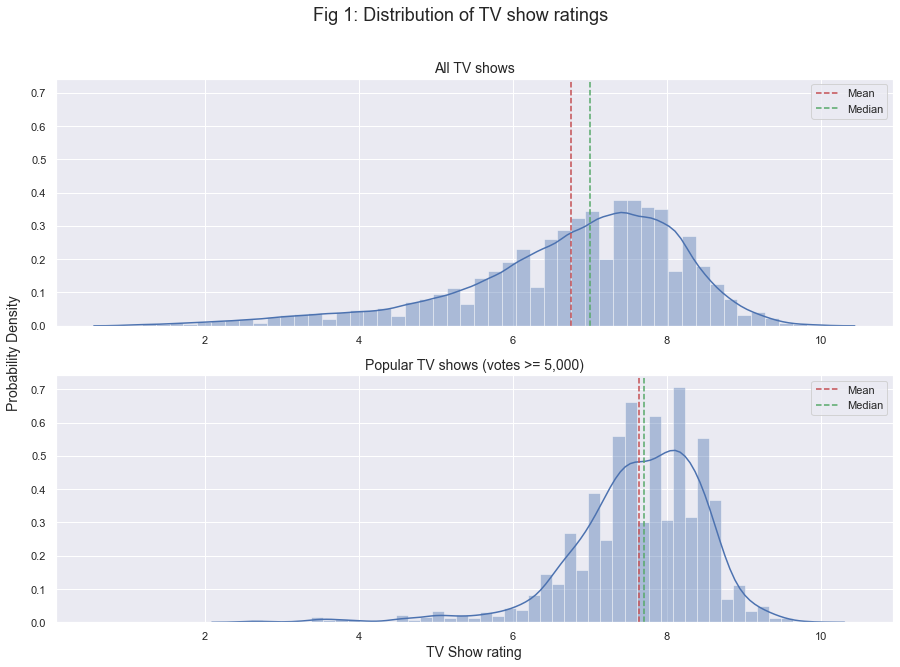

In [13]:
tvseries_ratings_top5k = tvseries_ratings[tvseries_ratings['numVotes'] >= 5000]

fig = plt.figure(figsize=(15,10))
plt.subplot(2,1,1)
ax = sns.distplot(tvseries_ratings['averageRating'], axlabel=False)
mean = tvseries_ratings['averageRating'].mean()
median = tvseries_ratings['averageRating'].median()
ax.axvline(mean, color='r', linestyle='--')
ax.axvline(median, color='g', linestyle='--')
plt.legend({'Mean': mean,'Median': median})
plt.title('All TV shows', fontsize=14)

plt.subplot(2,1,2, sharex=ax, sharey=ax)
ax2 = sns.distplot(tvseries_ratings_top5k['averageRating'], axlabel=False)
mean = tvseries_ratings_top5k['averageRating'].mean()
median = tvseries_ratings_top5k['averageRating'].median()
ax2.axvline(mean, color='r', linestyle='--')
ax2.axvline(median, color='g', linestyle='--')
ax2.set_xlabel("TV Show rating",fontsize=14)
plt.legend({'Mean': mean,'Median': median})
plt.title(label='Popular TV shows (votes >= 5,000)', fontsize=14)

fig.text(0.08, 0.5, 'Probability Density', va='center', rotation='vertical', fontsize=14)

plt.suptitle('Fig 1: Distribution of TV show ratings', fontsize=18)
fig.savefig('fig1.png', dpi=fig.dpi)

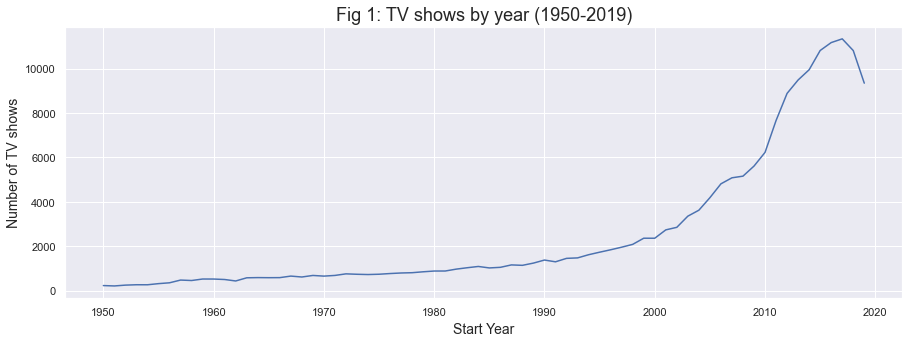

In [14]:
fig = plt.figure(figsize=(15,5))
df = tvseries_startYear_filtered.groupby('startYear')[['tconst']].count().reset_index()
df2 = df[(df['startYear'] >= '1950') & (df['startYear'] <= '2019')]
df2.rename(columns={'tconst':'numShows'}, inplace=True)
ax = sns.lineplot(x='startYear',y='numShows',data=df2)
#ax.set(xlabel='Start Year', ylabel='Number of TV shows')
ax.set_xlabel("Start Year",fontsize=14)
ax.set_ylabel("Number of TV shows",fontsize=14)
plt.title(label='Fig 1: TV shows by year (1950-2019)', fontsize=18)
fig.savefig('fig2.1.png', dpi=fig.dpi)

### 2) Are certain tv series overrated / underrated?

In [15]:
tmp1 = tvseries_episodes_ratings[(tvseries_episodes_ratings['seasonNumber'] != '\\N') &
                                       (tvseries_episodes_ratings['episodeNumber'] != '\\N') & 
                                (tvseries_episodes_ratings['startYear'] != '\\N')]
tmp1[['seasonNumber', 'episodeNumber']] = tmp1[['seasonNumber', 'episodeNumber']].astype(int)
tmp1.loc[tmp1.endYear == '\\N', 'endYear'] = ''
tmp1['sumEpisodeRating'] = tmp1['averageRating_y'] * tmp1['numVotes_y']
xyz = tmp1.groupby('tconst_x')['sumEpisodeRating'].sum()/tmp1.groupby('tconst_x')['numVotes_y'].sum()

abc1 = xyz.to_frame().reset_index(level='tconst_x').rename(columns={0: "wtd_mean_averageRating"})
abc2 = tmp1.groupby('tconst_x')[['averageRating_y', 'numVotes_y']].mean().reset_index(level='tconst_x').rename(columns={'averageRating_y': "mean_averageRating", "numVotes_y": "mean_numVotes"})
abc3 = tmp1.groupby('tconst_x')[['averageRating_y', 'numVotes_y']].std().reset_index(level='tconst_x').rename(columns={'averageRating_y': "stdDev_averageRating", "numVotes_y": "stdDev_numVotes"})
abc4 = tmp1.groupby('tconst_x')[['averageRating_y', 'numVotes_y']].median().reset_index(level='tconst_x').rename(columns={'averageRating_y': "median_averageRating", "numVotes_y": "median_numVotes"})
abc5 = tmp1.groupby('tconst_x')[['averageRating_y', 'numVotes_y']].min().reset_index(level='tconst_x').rename(columns={'averageRating_y': "min_averageRating", "numVotes_y": "min_numVotes"})
abc6 = tmp1.groupby('tconst_x')[['averageRating_y', 'numVotes_y', 'seasonNumber']].max().reset_index(level='tconst_x').rename(columns={'averageRating_y': "max_averageRating", "numVotes_y": "max_numVotes", "seasonNumber": "numSeasons"})

abc8 = tmp1.groupby('tconst_x')['numVotes_y'].sum().reset_index(level='tconst_x').rename(columns={'numVotes_y': "total_numVotes"})
abc9 = tmp1.groupby('tconst_x')['episodeNumber'].count().reset_index(level='tconst_x').rename(columns={'episodeNumber': "total_episodes"})
abc10 = tmp1.groupby('tconst_x')[['averageRating_y']].quantile(0.125).reset_index(level='tconst_x').rename(columns={'averageRating_y': "q1a_averageRating"})
abc11 = tmp1.groupby('tconst_x')[['averageRating_y']].quantile(0.875).reset_index(level='tconst_x').rename(columns={'averageRating_y': "q3a_averageRating"})
abc12 = tmp1.groupby('tconst_x')[['averageRating_y']].quantile(0.25).reset_index(level='tconst_x').rename(columns={'averageRating_y': "q1_averageRating"})
abc13 = tmp1.groupby('tconst_x')[['averageRating_y']].quantile(0.75).reset_index(level='tconst_x').rename(columns={'averageRating_y': "q3_averageRating"})


tmp2 = pd.merge(tmp1, abc1, on='tconst_x')
tmp3 = pd.merge(tmp2, abc2, on='tconst_x')
tmp4 = pd.merge(tmp3, abc3, on='tconst_x')
tmp5 = pd.merge(tmp4, abc4, on='tconst_x')
tmp6 = pd.merge(tmp5, abc5, on='tconst_x')
tmp7 = pd.merge(tmp6, abc6, on='tconst_x')
tmp8 = pd.merge(tmp7, abc12, on='tconst_x')
tmp8a = pd.merge(tmp8, abc13, on='tconst_x')
tmp9 = pd.merge(tmp8a, abc8, on='tconst_x')
tmp10 = pd.merge(tmp9, abc9, on='tconst_x')
tmp11 = pd.merge(tmp10, abc10, on='tconst_x')
tmp12 = pd.merge(tmp11, abc11, on='tconst_x')


tmp13 = tmp12.groupby(['tconst_x', 'primaryTitle', 'startYear', 'endYear', 'genres', 'titleType']).mean().reset_index()

tmp13['rel_avgRatingDeviation_pc'] = (tmp13['averageRating_x'] - tmp13['median_averageRating'])/tmp13['averageRating_x']*100
tmp13['rel_stdDevRating_pc'] = tmp13['stdDev_averageRating']/tmp13['mean_averageRating']*100
tmp13 = tmp13.drop(['sumEpisodeRating', 'isAdult', 'seasonNumber', 'episodeNumber', 'averageRating_y', 'numVotes_y'], axis=1)
tmp13['log_numVotes'] = np.log(tmp13['numVotes_x'])
tmp13['log_mean_numVotes'] = np.log(tmp13['mean_numVotes'])
tmp13['log_median_numVotes'] = np.log(tmp13['median_numVotes'])
tmp13['log_total_episodes'] = np.log(tmp13['total_episodes'])
tmp13['ratingGroup'] = tmp13['averageRating_x'].apply(lambda x: 'Below 8.0' if x < 8 else ('8.5 or above' if x >= 8.5 else '8.0-8.5'))
tmp13['median_ratingGroup'] = tmp13['median_averageRating'].apply(lambda x: 'Below 8.0' if x < 8 else ('8.5 or above' if x >= 8.5 else '8.0-8.5'))
tmp13['mean_ratingGroup'] = tmp13['mean_averageRating'].apply(lambda x: 'Below 8.0' if x < 8 else ('8.5 or above' if x >= 8.5 else '8.0-8.5'))


tmp13['rel_medDevRating_pc'] = (tmp13['q3a_averageRating'] - tmp13['q1a_averageRating'])/tmp13['median_averageRating']*100
tmp13['seasonGroup'] = tmp13['numSeasons'].apply(lambda x: '1' if x < 2 else ('2-4' if x < 5 else '5+'))
tmp13['yearGroup'] = tmp13['startYear'].apply(lambda x: 'Before 2000' if int(x) < 2000 else ('2015-2020' if int(x) >= 2015 else '2000-2014'))

tvseries_episodes_ratings_stats = tmp13.rename(columns={'tconst_x': "id", "averageRating_x": 
                                                                "averageRating", "numVotes_x": "numVotes"})
#num seasons for these is not accurate, so filter seasons greater than 85. based on manual inspection
tvseries_episodes_ratings_stats = tvseries_episodes_ratings_stats[tvseries_episodes_ratings_stats['numSeasons'] < 85]
tvseries_episodes_ratings_popular = tvseries_episodes_ratings_stats[(tvseries_episodes_ratings_stats['median_numVotes'] >= 250) & 
                                                                    (tvseries_episodes_ratings_stats['numVotes'] >= 5000)]
tvseries_episodes_ratings_popular['showTitle'] = tvseries_episodes_ratings_popular["primaryTitle"] + " (" + tvseries_episodes_ratings_popular["startYear"].astype(str) + "-" + tvseries_episodes_ratings_popular["endYear"].astype(str) + ")"
tvseries_episodes_ratings_popular['series_episodes_rating'] = tvseries_episodes_ratings_popular["numSeasons"].astype(int).astype(str) + ", " + tvseries_episodes_ratings_popular["total_episodes"].astype(int).astype(str) + ", " + tvseries_episodes_ratings_popular["averageRating"].round(3).astype(str)
tvseries_episodes_ratings_popular['median_mean_rating'] = tvseries_episodes_ratings_popular["median_averageRating"].round(3).astype(str) + ", " + tvseries_episodes_ratings_popular["mean_averageRating"].round(3).astype(str)


greater_than_1_season = tvseries_episodes_ratings_stats[tvseries_episodes_ratings_stats['numSeasons'] > 1][['id']]

tvseries_episodes_ratings_popular.describe(include='all')

,id,primaryTitle,startYear,endYear,genres,titleType,averageRating,numVotes,wtd_mean_averageRating,mean_averageRating,mean_numVotes,stdDev_averageRating,stdDev_numVotes,median_averageRating,median_numVotes,min_averageRating,min_numVotes,max_averageRating,max_numVotes,numSeasons,q1_averageRating,q3_averageRating,total_numVotes,total_episodes,q1a_averageRating,q3a_averageRating,rel_avgRatingDeviation_pc,rel_stdDevRating_pc,log_numVotes,log_mean_numVotes,log_median_numVotes,log_total_episodes,ratingGroup,median_ratingGroup,mean_ratingGroup,rel_medDevRating_pc,seasonGroup,yearGroup,showTitle,series_episodes_rating,median_mean_rating
count,799,799,799,799,799,799,799.000,799.000,799.000,799.000,799.000,799.000,799.000,799.000,799.000,799.000,799.000,799.000,799.000,799.000,799.000,799.000,799.000,799.000,799.000,799.000,799.000,799.000,799.000,799.000,799.000,799.000,799,799,799,799.000,799,799,799,799,799
unique,799,788,49,49,156,2,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,3,3,3,nan,3,3,799,649,734
top,tt0112159,Battlestar Galactica,2019,,"Crime,Drama,Mystery",tvSeries,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,Below 8.0,8.0-8.5,8.0-8.5,nan,2-4,2015-2020,Utopia (2013-2014),"1, 8, 8.1","8.4, 8.4"
freq,1,3,90,270,73,689,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,353,332,326,nan,305,403,1,5,5
mean,NaN,NaN,NaN,NaN,NaN,NaN,7.932,71458.433,8.115,8.089,1311.895,0.398,434.148,8.078,1221.522,7.215,828.517,8.892,2877.429,3.413,7.847,8.327,62605.434,48.783,7.691,8.504,-2.308,4.961,10.495,6.609,6.549,3.226,NaN,NaN,NaN,10.113,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,0.740,122785.927,0.560,0.553,3180.968,0.190,1773.404,0.548,2829.919,0.962,2191.383,0.670,9674.047,3.358,0.574,0.561,173521.076,69.579,0.616,0.588,7.022,2.503,1.103,0.864,0.863,1.134,NaN,NaN,NaN,5.382,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,3.500,5009.000,3.712,3.700,230.862,0.000,5.657,3.700,250.000,2.500,5.000,4.000,279.000,1.000,3.600,3.800,600.000,2.000,3.500,3.900,-71.429,0.000,8.519,5.442,5.521,0.693,NaN,NaN,NaN,0.000,NaN,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,7.500,15020.000,7.856,7.813,376.880,0.277,94.078,7.800,351.500,6.900,241.500,8.500,680.000,1.000,7.575,8.050,5687.000,10.000,7.400,8.200,-5.783,3.408,9.617,5.932,5.862,2.303,NaN,NaN,NaN,6.641,NaN,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,8.100,33149.000,8.162,8.133,587.986,0.370,174.363,8.100,549.500,7.500,376.000,9.000,1139.000,2.000,7.900,8.400,16985.000,24.000,7.775,8.588,-1.370,4.514,10.409,6.377,6.309,3.178,NaN,NaN,NaN,9.320,NaN,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,8.400,76220.500,8.477,8.440,1200.757,0.478,358.413,8.400,1136.250,7.800,722.500,9.400,2581.500,5.000,8.200,8.700,53132.000,59.000,8.100,8.900,1.724,5.865,11.241,7.091,7.035,4.078,NaN,NaN,NaN,12.351,NaN,NaN,NaN,NaN,NaN


In [16]:
tvseries_episodes_ratings_popular.sort_values(by='rel_stdDevRating_pc', ascending=False)

,id,primaryTitle,startYear,endYear,genres,titleType,averageRating,numVotes,wtd_mean_averageRating,mean_averageRating,mean_numVotes,stdDev_averageRating,stdDev_numVotes,median_averageRating,median_numVotes,min_averageRating,min_numVotes,max_averageRating,max_numVotes,numSeasons,q1_averageRating,q3_averageRating,total_numVotes,total_episodes,q1a_averageRating,q3a_averageRating,rel_avgRatingDeviation_pc,rel_stdDevRating_pc,log_numVotes,log_mean_numVotes,log_median_numVotes,log_total_episodes,ratingGroup,median_ratingGroup,mean_ratingGroup,rel_medDevRating_pc,seasonGroup,yearGroup,showTitle,series_episodes_rating,median_mean_rating
2211,tt0103352,Are You Afraid of the Dark?,1990,2000,"Drama,Family,Fantasy",tvSeries,8.200,12740.000,8.313,8.088,574.868,1.999,176.050,8.900,569.000,2.600,180.000,9.500,988.000,7.000,8.150,9.100,52313.000,91.000,4.450,9.300,-8.537,24.721,9.453,6.354,6.344,4.511,8.0-8.5,8.5 or above,8.0-8.5,54.494,5+,Before 2000,Are You Afraid of the Dark? (1990-2000),"7, 91, 8.2","8.9, 8.088"
20875,tt9139220,Dracula,2020,,"Drama,Horror",tvMiniSeries,6.800,36898.000,7.007,6.967,4526.000,1.550,358.396,7.600,4382.000,5.200,4262.000,8.100,4934.000,1.000,6.400,7.850,13578.000,3.000,5.800,7.975,-11.765,22.253,10.516,8.418,8.385,1.099,Below 8.0,Below 8.0,Below 8.0,28.618,1,2015-2020,Dracula (2020-),"1, 3, 6.8","7.6, 6.967"
11475,tt1856010,House of Cards,2013,2018,Drama,tvSeries,8.700,450744.000,8.022,8.063,3784.863,1.496,1095.100,8.400,3654.000,2.500,2258.000,9.600,8100.000,6.000,8.200,8.800,276295.000,73.000,7.900,9.100,3.448,18.556,13.019,8.239,8.204,4.290,8.5 or above,8.0-8.5,8.0-8.5,14.286,5+,2000-2014,House of Cards (2013-2018),"6, 73, 8.7","8.4, 8.063"
16004,tt4655480,Chicago Med,2015,,Drama,tvSeries,7.500,12076.000,6.535,7.100,304.981,1.134,169.988,7.000,303.000,4.400,73.000,8.900,799.000,5.000,6.600,8.150,31413.000,103.000,5.400,8.300,6.667,15.971,9.399,5.720,5.714,4.635,Below 8.0,Below 8.0,Below 8.0,41.429,5+,2015-2020,Chicago Med (2015-),"5, 103, 7.5","7.0, 7.1"
3960,tt0206512,SpongeBob SquarePants,1999,,"Animation,Comedy,Family",tvSeries,8.100,78898.000,7.861,7.497,362.828,1.186,228.760,7.600,298.000,3.200,39.000,9.800,2100.000,12.000,6.800,8.400,94698.000,261.000,6.200,8.800,6.173,15.824,11.276,5.894,5.697,5.565,8.0-8.5,Below 8.0,Below 8.0,34.211,5+,Before 2000,SpongeBob SquarePants (1999-),"12, 261, 8.1","7.6, 7.497"
6182,tt0436992,Doctor Who,2005,,"Adventure,Drama,Family",tvSeries,8.600,193454.000,7.898,7.731,5212.088,1.081,1663.560,7.750,5127.500,4.100,16.000,9.800,17495.000,12.000,7.100,8.500,833934.000,160.000,6.587,9.000,9.884,13.988,12.173,8.559,8.542,5.075,8.5 or above,Below 8.0,Below 8.0,31.129,5+,2000-2014,Doctor Who (2005-),"12, 160, 8.6","7.75, 7.731"
5482,tt0369179,Two and a Half Men,2003,2015,"Comedy,Romance",tvSeries,7.000,234222.000,7.500,7.402,839.435,1.024,252.764,7.900,824.500,3.900,480.000,8.800,2968.000,12.000,6.400,8.100,219932.000,262.000,6.000,8.300,-12.857,13.835,12.364,6.733,6.715,5.568,Below 8.0,Below 8.0,Below 8.0,29.114,5+,2000-2014,Two and a Half Men (2003-2015),"12, 262, 7.0","7.9, 7.402"
20528,tt8712204,Batwoman,2019,,"Action,Adventure,Crime",tvSeries,3.500,25585.000,5.812,6.121,1193.737,0.802,854.330,6.000,915.000,4.800,188.000,7.700,3430.000,1.000,5.500,6.750,22681.000,19.000,5.300,7.100,-71.429,13.099,10.150,7.085,6.819,2.944,Below 8.0,Below 8.0,Below 8.0,30.000,1,2015-2020,Batwoman (2019-),"1, 19, 3.5","6.0, 6.121"
15142,tt3921180,Scream: The TV Series,2015,,"Crime,Drama,Horror",tvSeries,7.200,32252.000,7.813,7.569,936.138,0.987,350.856,7.900,934.000,5.300,336.000,8.700,1791.000,3.000,7.600,8.200,27148.000,29.000,6.000,8.500,-9.722,13.037,10.381,6.842,6.839,3.367,Below 8.0,Below 8.0,Below 8.0,31.646,2-4,2015-2020,Scream: The TV Series (2015-),"3, 29, 7.2","7.9, 7.569"
14608,tt3520702,Bloodline,2015,2017,"Drama,Thriller",tvSeries,8.000,41366.000,7.969,8.042,729.364,1.043,271.287,8.100,660.000,3.900,395.000,9.300,1406.000,3.000,7.900,8.600,24069.000,33.000,7.600,8.800,-1.250,12.970

In [17]:
df = tvseries_episodes_ratings_popular.copy()
df['size'] = 4

from bokeh.plotting import figure, output_file, output_notebook, show, save, ColumnDataSource
from bokeh.models import HoverTool, CategoricalColorMapper, Legend, LegendItem, CustomJS
from bokeh.transform import factor_mark, factor_cmap 
from bokeh.palettes import Magma
from bokeh.events import DoubleTap

output_notebook()
output_file("fig2.html")

source = ColumnDataSource(data=df)

p = figure(plot_width=900, plot_height=600, tools=["box_zoom"], 
           title="Fig 2: TV show and episode ratings (Interactive plot)")
#p.min_border_top = 300
#p.min_border_bottom = 100
p.js_on_event(DoubleTap, CustomJS(args=dict(p=p), code='p.reset.emit()'))

COLOR_FACTORS = ['Before 2000', '2000-2014', '2015-2020']
MARKER_FACTORS = ['1', '2-4', '5+']
MARKERS = ['triangle', 'square', 'circle']

x = np.array(df['median_averageRating'])
y = np.array(df['averageRating'])

slope = 1
intercept = 0
## plot y = x
y_predicted = [slope*i + intercept  for i in x]

line = p.line(x, y_predicted, color='green')

scatter = p.scatter('median_averageRating', 'averageRating', size='size', source=source, alpha=0.5,
                  color=factor_cmap("yearGroup", Magma[3], COLOR_FACTORS),
                   marker=factor_mark('seasonGroup', MARKERS, MARKER_FACTORS))

hover = HoverTool(tooltips=[
    ("Title", "@showTitle"),
    ("Seasons, Episodes, Rating", "@series_episodes_rating"),
    ("Median, Mean episode rating", "@median_mean_rating"),
    ("Relative rating deviation %", "@rel_avgRatingDeviation_pc"),
    ("Genres", "@genres"),
], renderers=[scatter])

p.add_tools(hover)

# create an invisible renderer to drive color legend
rc = p.rect(x=4, y=9, height=1, width=1, color=Magma[3])
rc.visible = False

# add a color legend with explicit index, set labels to fit your need
legend = Legend(items=[
    LegendItem(label=COLOR_FACTORS[i], renderers=[rc], index=i) for i, c in enumerate(Magma[3])
], location="top_left")
legend.title = 'Show Start Year'
p.add_layout(legend)

# create an invisible renderer to drive shape legend
rs = p.scatter(x=4, y=4, color="blue", marker=MARKERS)
rs.visible = False

# add a shape legend with explicit index, set labels to fit your needs
legend = Legend(items=[
    LegendItem(label=MARKER_FACTORS[i], renderers=[rs], index=i) for i, s in enumerate(MARKER_FACTORS)
], location="center_left")
legend.title = 'Number of Seasons'
p.add_layout(legend)

p.title.align = 'center'
p.xaxis.axis_label = 'Median episode rating'
p.yaxis.axis_label = 'TV show rating'
p.background_fill_color = "grey"
p.xaxis.axis_label_text_font_size = "12pt"
p.yaxis.axis_label_text_font_size = "12pt"
p.title.text_font_size = '12pt'

show(p)
#save(p)

Loading BokehJS ...

#### Relative rating deviation by Genres, Seasons, and Show Release Year 

In [18]:
import plotly.express as px

df = tvseries_episodes_ratings_popular.copy()
df['averageRating'] = df['averageRating'].round(3)
df['median_averageRating'] = df['median_averageRating'].round(3)
df['rel_avgRatingDeviation_pc'] = df['rel_avgRatingDeviation_pc'].round(3)
df['seasonGroup'] = df['numSeasons'].apply(lambda x: '1 Season' if x < 2 else ('2-4 Seasons' if x < 5 else '5+ Seasons'))

fig = px.box(df, x="seasonGroup", y="rel_avgRatingDeviation_pc", hover_name='showTitle',
             hover_data=['series_episodes_rating','median_mean_rating','genres'], color='yearGroup',
             labels={'rel_avgRatingDeviation_pc':'Relative rating deviation (%)', 
                     'showTitle':'Title', 'series_episodes_rating': 'Seasons, Episodes, Rating', 'median_mean_rating': 'Median, Mean episode rating', 
                     'genres': 'Genres', 'yearGroup': 'Show Start Year', 'seasonGroup': 'Season Group'},
            title="Fig 3a: Relative Rating Deviation for Season and Year (Interactive plot)",
            width=900, height=600)
fig.show()
fig.write_html("fig3a.html")

In [19]:
import plotly.express as px

df = tvseries_episodes_ratings_popular.copy()
df['averageRating'] = df['averageRating'].round(3)
df['median_averageRating'] = df['median_averageRating'].round(3)
df['rel_avgRatingDeviation_pc'] = df['rel_avgRatingDeviation_pc'].round(3)
df['seasonGroup'] = df['numSeasons'].apply(lambda x: '1 Season' if x < 2 else ('2-4 Seasons' if x < 5 else '5+ Seasons'))

fig = px.box(df, x="seasonGroup", y="rel_avgRatingDeviation_pc", hover_name='showTitle',
             hover_data=['series_episodes_rating','median_mean_rating','genres'], color='yearGroup',
             labels={'rel_avgRatingDeviation_pc':'Relative rating deviation (%)', 
                     'showTitle':'Title', 'series_episodes_rating': 'Seasons, Episodes, Rating', 'median_mean_rating': 'Median, Mean episode rating', 
                     'genres': 'Genres', 'yearGroup': 'Show Start Year', 'seasonGroup': 'Season Group'},
            title="Fig 3a: Relative Rating Deviation for Season and Year",
            width=900, height=600)
fig.show()
fig.write_image("fig3a.png")

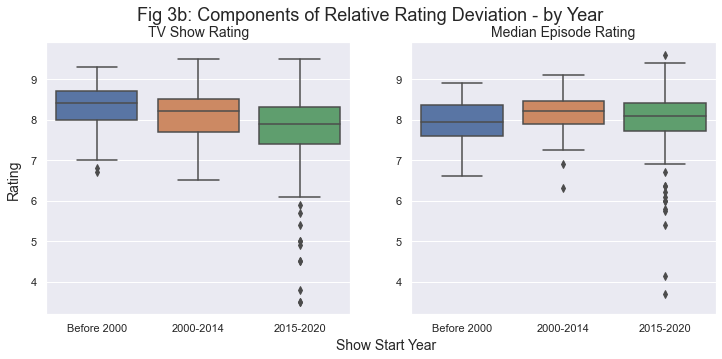

In [20]:
df = tvseries_episodes_ratings_popular.copy()
order = ['Before 2000', '2000-2014', '2015-2020']

fig = plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
ax = sns.boxplot(y="averageRating", x="yearGroup", data=df, order=order)
ax.set(xlabel=None, ylabel=None)
plt.title(label='TV Show Rating', fontsize=14)

plt.subplot(1,2,2, sharex=ax, sharey=ax)
ax2 = sns.boxplot(y="median_averageRating", x="yearGroup", data=df, order=order)
ax2.set(xlabel=None, ylabel=None)
plt.title(label='Median Episode Rating', fontsize=14)

fig.text(0.08, 0.5, 'Rating', va='center', rotation='vertical', fontsize=14)
fig.text(0.46, 0.04, 'Show Start Year', va='center', rotation='horizontal', fontsize=14)
plt.suptitle('Fig 3b: Components of Relative Rating Deviation - by Year', fontsize=18)

fig.savefig('fig3b.png', dpi=fig.dpi)

In [21]:
import plotly.express as px

tvseries_with_genres2 = tvseries_with_genres[['tconst', 'single_genre']]
df = pd.merge(tvseries_with_genres2, tvseries_episodes_ratings_popular, left_on='tconst', right_on='id')
df2 = df.groupby('single_genre')[['tconst']].count()
df3 = df2[df2['tconst'] > 10]
df4 = pd.merge(df, df3, on='single_genre')
df4.sort_values(by='single_genre', inplace=True)

df4['averageRating'] = df4['averageRating'].round(3)
df4['median_averageRating'] = df4['median_averageRating'].round(3)
df4['rel_avgRatingDeviation_pc'] = df4['rel_avgRatingDeviation_pc'].round(3)

fig = px.box(df4, x="single_genre", y="rel_avgRatingDeviation_pc", hover_name='showTitle',
             hover_data=['series_episodes_rating','median_mean_rating','genres'], 
             labels={'single_genre':'Genre', 'rel_avgRatingDeviation_pc':'Relative rating deviation (%)', 
                     'showTitle':'Title', 'series_episodes_rating': 'Seasons, Episodes, Rating', 'median_mean_rating': 'Median, Mean episode rating', 
                     'genres': 'All genres'}, title="Fig 4a: Relative Rating Deviation by Genre (Interactive plot)",
            width=900, height=600)

fig.show()
fig.write_html("fig4a.html")

In [22]:
import plotly.express as px

tvseries_with_genres2 = tvseries_with_genres[['tconst', 'single_genre']]
df = pd.merge(tvseries_with_genres2, tvseries_episodes_ratings_popular, left_on='tconst', right_on='id')
df2 = df.groupby('single_genre')[['tconst']].count()
df3 = df2[df2['tconst'] > 10]
df4 = pd.merge(df, df3, on='single_genre')
df4.sort_values(by='single_genre', inplace=True)

df4['averageRating'] = df4['averageRating'].round(3)
df4['median_averageRating'] = df4['median_averageRating'].round(3)
df4['rel_avgRatingDeviation_pc'] = df4['rel_avgRatingDeviation_pc'].round(3)

fig = px.box(df4, x="single_genre", y="rel_avgRatingDeviation_pc", hover_name='showTitle',
             hover_data=['series_episodes_rating','median_mean_rating','genres'], 
             labels={'single_genre':'Genre', 'rel_avgRatingDeviation_pc':'Relative rating deviation (%)', 
                     'showTitle':'Title', 'series_episodes_rating': 'Seasons, Episodes, Rating', 'median_mean_rating': 'Median, Mean episode rating', 
                     'genres': 'All genres'}, title="Fig 4a: Relative Rating Deviation by Genre",
            width=900, height=600)

fig.show()
fig.write_image("fig4a.png")

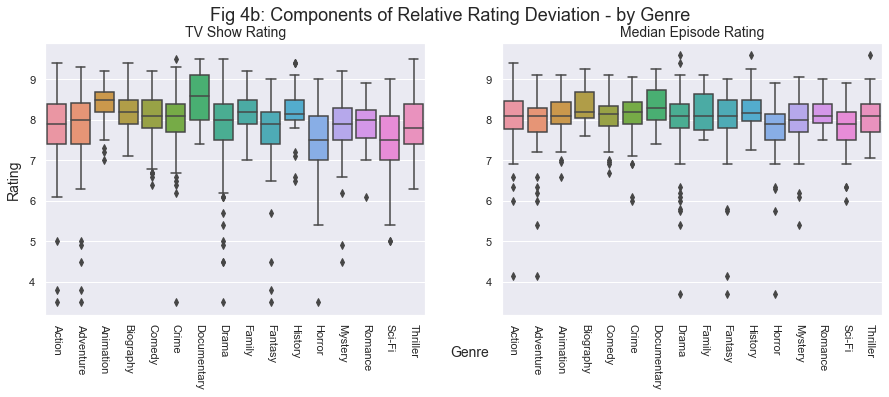

In [23]:
tvseries_with_genres2 = tvseries_with_genres[['tconst', 'single_genre']]
df = pd.merge(tvseries_with_genres2, tvseries_episodes_ratings_popular, left_on='tconst', right_on='id')
df2 = df.groupby('single_genre')[['tconst']].count()
df3 = df2[df2['tconst'] > 10]
df4 = pd.merge(df, df3, on='single_genre')
df4.sort_values(by='single_genre', inplace=True)

GENRES=['Action', 'Adventure', 'Animation', 'Biography', 'Comedy', 'Crime', 'Documentary', 'Drama', 'Family', 'Fantasy', 
     'History', 'Horror', 'Mystery', 'Romance', 'Sci-Fi', 'Thriller']

fig = plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
ax = sns.boxplot(y="averageRating", x="single_genre", data=df4, order=GENRES)
ax.set(xlabel=None, ylabel=None)
ax.set_xticklabels(ax.get_xticklabels(),rotation=-90)
plt.title(label='TV Show Rating', fontsize=14)

plt.subplot(1,2,2, sharex=ax, sharey=ax)
ax2 = sns.boxplot(y="median_averageRating", x="single_genre", data=df4, order=GENRES)
ax2.set(xlabel=None, ylabel=None)
ax2.set_xticklabels(ax.get_xticklabels(),rotation=-90)
plt.title(label='Median Episode Rating', fontsize=14)

fig.text(0.09, 0.5, 'Rating', va='center', rotation='vertical', fontsize=14)
fig.text(0.5, 0.02, 'Genre', va='center', rotation='horizontal', fontsize=14)
plt.suptitle('Fig 4b: Components of Relative Rating Deviation - by Genre', fontsize=18)

fig.savefig('fig4b.png', dpi=fig.dpi)

In [24]:
#df = tvseries_episodes_ratings_popular.copy()
#df['size'] = df['log_numVotes']*df['log_numVotes']*df['log_numVotes']/200
#df['size'] = 4
import math

tvseries_with_genres2 = tvseries_with_genres[['tconst', 'single_genre']]
df = pd.merge(tvseries_with_genres2, tvseries_episodes_ratings_popular, left_on='tconst', right_on='id')
df2 = df.groupby('single_genre')[['tconst']].count()
df3 = df2[df2['tconst'] > 10]
df4 = pd.merge(df, df3, on='single_genre')
df4.sort_values(by='single_genre', inplace=True)

df4['averageRating'] = df4['averageRating'].round(3)
df4['mean_averageRating'] = df4['mean_averageRating'].round(3)
df4['rel_stdDevRating_pc'] = df4['rel_stdDevRating_pc'].round(3)

df = df4
df['size'] = 4

GENRES=['Action', 'Adventure', 'Animation', 'Biography', 'Comedy', 'Crime', 'Documentary', 'Drama', 'Family', 'Fantasy', 
     'History', 'Horror', 'Mystery', 'Romance', 'Sci-Fi', 'Thriller']

from bokeh.plotting import figure, output_file, output_notebook, show, ColumnDataSource
from bokeh.models import HoverTool, CategoricalColorMapper, Legend, LegendItem
from bokeh.transform import factor_mark, factor_cmap 
from bokeh.palettes import Magma
from bokeh.transform import jitter

#output_notebook()
output_file("fig5.html")

source = ColumnDataSource(data=df)

p = figure(plot_width=900, plot_height=600, tools=["box_zoom"], x_range=GENRES,
           title="Fig 5: Relative Rating Deviation for Genres and Year (Interactive plot)")
#p.min_border_top = 300
#p.min_border_bottom = 100
p.js_on_event(DoubleTap, CustomJS(args=dict(p=p), code='p.reset.emit()'))

#COLOR_FACTORS = ['Mean Rating Below 8.0','8.0-8.5','8.5 or above']
#MARKER_FACTORS = ['Before 2000', '2000-2014', '2015-2020']
COLOR_FACTORS = ['Before 2000', '2000-2014', '2015-2020']
#MARKERS = ['triangle', 'square', 'circle']

scatter = p.scatter(x=jitter("single_genre", width=0.6, range=p.x_range), y="rel_avgRatingDeviation_pc", size='size', source=source, alpha=0.5,
                   color=factor_cmap('yearGroup', Magma[3], COLOR_FACTORS)
                   #marker=factor_mark('yearGroup', MARKERS, MARKER_FACTORS)
                   )

hover = HoverTool(tooltips=[
    ("Title", "@showTitle"),
    ("Seasons, Episodes, Rating", "@series_episodes_rating"),
    ("Median, Mean episode rating", "@median_mean_rating"),
    ("Relative rating deviation %", "@rel_avgRatingDeviation_pc"),
    ("Genres", "@genres"),
], renderers=[scatter])

p.add_tools(hover)

# create an invisible renderer to drive color legend
rc = p.rect(x=4, y=9, height=1, width=1, color=Magma[3])
rc.visible = False

# add a color legend with explicit index, set labels to fit your need
legend = Legend(items=[
    LegendItem(label=COLOR_FACTORS[i], renderers=[rc], index=i) for i, c in enumerate(Magma[3])
], location="bottom_right")
legend.title = 'Show Start Year'
p.add_layout(legend)

p.title.align = 'center'
p.xaxis.axis_label = 'Genre'
p.yaxis.axis_label = 'Relative rating deviation (%)'
p.background_fill_color = "grey"
p.xaxis.axis_label_text_font_size = "12pt"
p.yaxis.axis_label_text_font_size = "12pt"
p.title.text_font_size = '12pt'

p.xaxis.major_label_orientation = -math.pi/4

show(p)

### 3) Which series are most and least consistent?

In [25]:
df = tvseries_episodes_ratings_popular.copy()
#df['size'] = df['log_numVotes']*df['log_numVotes']*df['log_numVotes']/200
df['size'] = 4

from bokeh.plotting import figure, output_file, output_notebook, show, ColumnDataSource
from bokeh.models import HoverTool, CategoricalColorMapper, Legend, LegendItem
from bokeh.transform import factor_mark, factor_cmap 
from bokeh.palettes import Magma

#output_notebook()
output_file("fig6.html")

source = ColumnDataSource(data=df)

p = figure(plot_width=900, plot_height=600, tools=["box_zoom"], 
           title="Fig 6: Consistency of TV shows (Interactive plot)")
#p.min_border_top = 300
#p.min_border_bottom = 100
p.js_on_event(DoubleTap, CustomJS(args=dict(p=p), code='p.reset.emit()'))

COLOR_FACTORS = ['Below 8.0','8.0-8.5','8.5 or above']
MARKER_FACTORS = ['Before 2000', '2000-2014', '2015-2020']
MARKERS = ['triangle', 'square', 'circle']

x = np.array(df['log_total_episodes'])
y = np.array(df['rel_stdDevRating_pc'])

# determine best fit line
par = np.polyfit(x, y, 1, full=True)
slope = par[0][0]
intercept = par[0][1]
y_predicted = [slope*i + intercept  for i in x]

line = p.line(x, y_predicted, color='green')

genres = ['Biography', 'Documentary', 'History']
contains = [df['genres'].str.contains(i) for i in genres]
result = df[~np.any(contains, axis=0)]

x1 = np.array(result['log_total_episodes'])
y1 = np.array(result['rel_stdDevRating_pc'])

# determine best fit line excluding Biography, Doc, and Hist
par = np.polyfit(x1, y1, 1, full=True)
slope = par[0][0]
intercept = par[0][1]
y_predicted = [slope*i + intercept  for i in x1]

line = p.line(x1, y_predicted, color='white')

scatter = p.scatter('log_total_episodes', 'rel_stdDevRating_pc', size='size', source=source, alpha=0.5,
                  color=factor_cmap("mean_ratingGroup", Magma[3], COLOR_FACTORS),
                   marker=factor_mark('yearGroup', MARKERS, MARKER_FACTORS))

hover = HoverTool(tooltips=[
    ("Title", "@showTitle"),
    ("Seasons, Episodes, Rating", "@series_episodes_rating"),
    ("Median, Mean episode rating", "@median_mean_rating"),
    ("Relative standard deviation %", "@rel_stdDevRating_pc"),
    ("Genres", "@genres"),
], renderers=[scatter])

p.add_tools(hover)

# create an invisible renderer to drive color legend
rc = p.rect(x=6, y=4, height=1, width=1, color=Magma[3])
rc.visible = False

# add a color legend with explicit index, set labels to fit your need
legend = Legend(items=[
    LegendItem(label=COLOR_FACTORS[i], renderers=[rc], index=i) for i, c in enumerate(Magma[3])
], location="top_right")
legend.title = 'Mean Rating'
p.add_layout(legend)

# create an invisible renderer to drive shape legend
rs = p.scatter(x=4, y=4, color="blue", marker=MARKERS)
rs.visible = False

# add a shape legend with explicit index, set labels to fit your needs
legend = Legend(items=[
    LegendItem(label=MARKER_FACTORS[i], renderers=[rs], index=i) for i, s in enumerate(MARKER_FACTORS)
], location="top_center")
legend.title = 'Show Start Year'
p.add_layout(legend)

p.title.align = 'center'
p.xaxis.axis_label = 'Total episodes (Log scale)'
p.yaxis.axis_label = 'Relative standard deviation (%)'
p.background_fill_color = "grey"
p.xaxis.axis_label_text_font_size = "12pt"
p.yaxis.axis_label_text_font_size = "12pt"
p.title.text_font_size = '12pt'

show(p)

In [26]:
df = tvseries_episodes_ratings_popular.copy()
df['size'] = df['log_numVotes']*df['log_numVotes']*df['log_numVotes']/200

from bokeh.plotting import figure, output_file, output_notebook, show, ColumnDataSource
from bokeh.models import HoverTool, CategoricalColorMapper, Legend, LegendItem
from bokeh.transform import factor_mark, factor_cmap 
from bokeh.palettes import Viridis

output_notebook()

source = ColumnDataSource(data=df)

p = figure(plot_width=1200, plot_height=800, tools=["zoom_in","zoom_out","pan","wheel_zoom"], 
           title="Consistency of TV series")
#p.min_border_top = 300
#p.min_border_bottom = 100

COLOR_FACTORS = ['Median Rating Below 8.0','8.0-8.5','8.5 or above']
MARKER_FACTORS = ['Started before 2000', '2000-2014', '2015-2020']
MARKERS = ['triangle', 'square', 'circle']

scatter = p.scatter('log_total_episodes', 'rel_medDevRating_pc', size='size', source=source, alpha=0.5,
                  color=factor_cmap("median_ratingGroup", Viridis[3], COLOR_FACTORS),
                   marker=factor_mark('yearGroup', MARKERS, MARKER_FACTORS))

x = np.array(df['log_total_episodes'])
y = np.array(df['rel_medDevRating_pc'])

# determine best fit line
par = np.polyfit(x, y, 1, full=True)
slope = par[0][0]
intercept = par[0][1]
y_predicted = [slope*i + intercept  for i in x]

line = p.line(x, y_predicted, color='red')

hover = HoverTool(tooltips=[
    ("Title", "@showTitle"),
    ("Total Seasons", "@numSeasons"),
    ("Total Episodes", "@total_episodes"),
    ("Overall Series rating", "@averageRating"),
    ("Median episode rating", "@median_averageRating"),
    ("Relative median deviation %", "@rel_medDevRating_pc"),
    ("Genres", "@genres"),
], renderers=[scatter])

p.add_tools(hover)

# create an invisible renderer to drive color legend
rc = p.rect(x=6, y=4, height=1, width=1, color=Viridis[3])
rc.visible = False

# add a color legend with explicit index, set labels to fit your need
legend = Legend(items=[
    LegendItem(label=COLOR_FACTORS[i], renderers=[rc], index=i) for i, c in enumerate(Viridis[3])
], location="top_right")
p.add_layout(legend)

# create an invisible renderer to drive shape legend
rs = p.scatter(x=4, y=4, color="grey", marker=MARKERS)
rs.visible = False

# add a shape legend with explicit index, set labels to fit your needs
legend = Legend(items=[
    LegendItem(label=MARKER_FACTORS[i], renderers=[rs], index=i) for i, s in enumerate(MARKER_FACTORS)
], location="top_left")
p.add_layout(legend)

p.title.align = 'center'
p.xaxis.axis_label = 'Log - Total episodes'
p.yaxis.axis_label = 'Relative range of mid 75 percent episodes (%)'
p.background_fill_color = "grey"

show(p)

Loading BokehJS ...

#### Consistency with respect to Genres, Rating, and Show Release Year 

In [27]:
df = tvseries_episodes_ratings_popular.copy()
df['averageRating'] = df['averageRating'].round(3)
df['mean_averageRating'] = df['mean_averageRating'].round(3)
df['rel_stdDevRating_pc'] = df['rel_stdDevRating_pc'].round(3)

fig = px.box(df, x="yearGroup", y="rel_stdDevRating_pc", hover_name='showTitle',
             hover_data=['series_episodes_rating','median_mean_rating','genres'], color='mean_ratingGroup',
             labels={'rel_stdDevRating_pc':'Relative standard deviation (%)', 
                     'showTitle':'Title', 'series_episodes_rating': 'Series, Episodes, Rating', 
                     'median_mean_rating': 'Median, Mean episode rating', 'genres': 'Genres', 'yearGroup': 'Show Start Year', 
                     'mean_ratingGroup': 'Mean Rating'},
            title="Fig 7a: Consistency of TV Shows for Rating and Year Groups (Interactive plot)",
            width=900, height=600)
fig.show()
fig.write_html("fig7a.html")

In [28]:
df = tvseries_episodes_ratings_popular.copy()
df['averageRating'] = df['averageRating'].round(3)
df['mean_averageRating'] = df['mean_averageRating'].round(3)
df['rel_stdDevRating_pc'] = df['rel_stdDevRating_pc'].round(3)

fig = px.box(df, x="yearGroup", y="rel_stdDevRating_pc", hover_name='showTitle',
             hover_data=['series_episodes_rating','median_mean_rating','genres'], color='mean_ratingGroup',
             labels={'rel_stdDevRating_pc':'Relative standard deviation (%)', 
                     'showTitle':'Title', 'series_episodes_rating': 'Series, Episodes, Rating', 
                     'median_mean_rating': 'Median, Mean episode rating', 'genres': 'Genres', 'yearGroup': 'Show Start Year', 
                     'mean_ratingGroup': 'Mean Rating'},
            title="Fig 7a: Consistency of TV Shows for Rating and Year Groups",
            width=900, height=600)
fig.show()
fig.write_image("fig7a.png")

In [29]:
df = tvseries_episodes_ratings_popular.copy()
df['averageRating'] = df['averageRating'].round(3)
df['mean_averageRating'] = df['mean_averageRating'].round(3)
df['log_total_episodes'] = df['log_total_episodes'].round(3)

fig = px.box(df, x="yearGroup", y="log_total_episodes", hover_name='showTitle',
             hover_data=['series_episodes_rating','median_mean_rating','genres'], color='mean_ratingGroup',
             labels={'log_total_episodes':'Total episodes (Log scale)', 
                     'showTitle':'Title', 'series_episodes_rating': 'Series, Episodes, Rating', 
                     'median_mean_rating': 'Median, Mean episode rating', 'genres': 'Genres', 'yearGroup': 'Show Start Year', 
                     'mean_ratingGroup': 'Mean Rating'},
            title="Fig 7b: Total Episodes by Rating and Year Groups (Interactive plot)",
            width=900, height=600)
fig.show()
fig.write_html("fig7b.html")

In [30]:
df = tvseries_episodes_ratings_popular.copy()
df['averageRating'] = df['averageRating'].round(3)
df['mean_averageRating'] = df['mean_averageRating'].round(3)
df['log_total_episodes'] = df['log_total_episodes'].round(3)

fig = px.box(df, x="yearGroup", y="log_total_episodes", hover_name='showTitle',
             hover_data=['series_episodes_rating','median_mean_rating','genres'], color='mean_ratingGroup',
             labels={'log_total_episodes':'Total episodes (Log scale)', 
                     'showTitle':'Title', 'series_episodes_rating': 'Series, Episodes, Rating', 
                     'median_mean_rating': 'Median, Mean episode rating', 'genres': 'Genres', 'yearGroup': 'Show Start Year', 
                     'mean_ratingGroup': 'Mean Rating'},
            title="Fig 7b: Total Episodes by Rating and Year Groups",
            width=900, height=600)
fig.show()
fig.write_image("fig7b.png")

In [31]:
tvseries_with_genres2 = tvseries_with_genres[['tconst', 'single_genre']]
df = pd.merge(tvseries_with_genres2, tvseries_episodes_ratings_popular, left_on='tconst', right_on='id')
df2 = df.groupby('single_genre')[['tconst']].count()
df3 = df2[df2['tconst'] > 10]
df4 = pd.merge(df, df3, on='single_genre')
df4.sort_values(by='single_genre', inplace=True)

df4['averageRating'] = df4['averageRating'].round(3)
df4['mean_averageRating'] = df4['mean_averageRating'].round(3)
df4['rel_stdDevRating_pc'] = df4['rel_stdDevRating_pc'].round(3)

fig = px.box(df4, x="single_genre", y="rel_stdDevRating_pc", hover_name='showTitle',
             hover_data=['series_episodes_rating','median_mean_rating',
                         'genres'], 
             labels={'single_genre':'Genre', 'rel_stdDevRating_pc':'Relative standard deviation (%)', 
                     'showTitle':'Title', 'series_episodes_rating': 'Series, Episodes, Rating', 
                     'median_mean_rating': 'Median, Mean episode rating', 'genres': 'All genres'},
            title="Fig 8a: Consistency of TV Shows by Genre (Interactive box plot)",
            width=900, height=600)
fig.show()
fig.write_html("fig8a.html")

In [32]:
tvseries_with_genres2 = tvseries_with_genres[['tconst', 'single_genre']]
df = pd.merge(tvseries_with_genres2, tvseries_episodes_ratings_popular, left_on='tconst', right_on='id')
df2 = df.groupby('single_genre')[['tconst']].count()
df3 = df2[df2['tconst'] > 10]
df4 = pd.merge(df, df3, on='single_genre')
df4.sort_values(by='single_genre', inplace=True)

df4['averageRating'] = df4['averageRating'].round(3)
df4['mean_averageRating'] = df4['mean_averageRating'].round(3)
df4['rel_stdDevRating_pc'] = df4['rel_stdDevRating_pc'].round(3)

fig = px.box(df4, x="single_genre", y="rel_stdDevRating_pc", hover_name='showTitle',
             hover_data=['series_episodes_rating','median_mean_rating',
                         'genres'], 
             labels={'single_genre':'Genre', 'rel_stdDevRating_pc':'Relative standard deviation (%)', 
                     'showTitle':'Title', 'series_episodes_rating': 'Series, Episodes, Rating', 
                     'median_mean_rating': 'Median, Mean episode rating', 'genres': 'All genres'},
            title="Fig 8a: Consistency of TV Shows by Genre",
            width=900, height=600)
fig.show()
fig.write_image("fig8a.png")

In [33]:
tvseries_with_genres2 = tvseries_with_genres[['tconst', 'single_genre']]
df = pd.merge(tvseries_with_genres2, tvseries_episodes_ratings_popular, left_on='tconst', right_on='id')
df2 = df.groupby('single_genre')[['tconst']].count()
df3 = df2[df2['tconst'] > 10]
df4 = pd.merge(df, df3, on='single_genre')
df4.sort_values(by='single_genre', inplace=True)

df4['averageRating'] = df4['averageRating'].round(3)
df4['mean_averageRating'] = df4['mean_averageRating'].round(3)
df4['rel_stdDevRating_pc'] = df4['rel_stdDevRating_pc'].round(3)

df = df4
df['size'] = df['log_total_episodes']*2+1

GENRES=['Action', 'Adventure', 'Animation', 'Biography', 'Comedy', 'Crime', 'Documentary', 'Drama', 'Family', 'Fantasy', 
     'History', 'Horror', 'Mystery', 'Romance', 'Sci-Fi', 'Thriller']

from bokeh.plotting import figure, output_file, output_notebook, show, ColumnDataSource
from bokeh.models import HoverTool, CategoricalColorMapper, Legend, LegendItem
from bokeh.transform import factor_mark, factor_cmap 
from bokeh.palettes import Magma
from bokeh.transform import jitter

#output_notebook()
output_file("fig8b.html")

source = ColumnDataSource(data=df)

p = figure(plot_width=900, plot_height=600, tools=["box_zoom"], x_range=GENRES,
           title="Fig 8b: Consistency of TV shows by Genre (Interactive plot)")
#p.min_border_top = 300
#p.min_border_bottom = 100
p.js_on_event(DoubleTap, CustomJS(args=dict(p=p), code='p.reset.emit()'))

MARKER_FACTORS = ['Size: Number of Episodes']
MARKERS = ['circle']

scatter = p.scatter(x=jitter("single_genre", width=0.6, range=p.x_range), y="rel_stdDevRating_pc", size='size', source=source, alpha=0.25
                   )

hover = HoverTool(tooltips=[
    ("Title", "@showTitle"),
    ("Seasons, Episodes, Rating", "@series_episodes_rating"),
    ("Median, Mean episode rating", "@median_mean_rating"),
    ("Relative standard deviation %", "@rel_stdDevRating_pc"),
    ("Genres", "@genres"),
], renderers=[scatter])

p.add_tools(hover)

# create an invisible renderer to drive shape legend
rs = p.scatter(x=4, y=4, color="skyblue", marker=MARKERS)
rs.visible = False

# add a shape legend with explicit index, set labels to fit your needs
legend = Legend(items=[
    LegendItem(label=MARKER_FACTORS[i], renderers=[rs], index=i) for i, s in enumerate(MARKER_FACTORS)
], location="top_left")
#legend.title = 'Number of Episodes'
p.add_layout(legend)

p.title.align = 'center'
p.xaxis.axis_label = 'Genre'
p.yaxis.axis_label = 'Relative standard deviation (%)'
p.xaxis.axis_label_text_font_size = "12pt"
p.yaxis.axis_label_text_font_size = "12pt"
p.title.text_font_size = '12pt'
p.xaxis.major_label_orientation = -math.pi/4

show(p)

### 4) Did the series cancel too early or went too far?

In [34]:
tmp1 = tmp1[tmp1['titleType'] == 'tvSeries']
newabc1 = tmp1.groupby(['tconst_x', 'seasonNumber'])[['averageRating_y']].median().reset_index(level=['tconst_x', 'seasonNumber'])
newtmp2 = pd.merge(newabc1, tmp1, on=['tconst_x', 'seasonNumber'])
newtmp2.describe(include='all')
newtmp3 = newtmp2.groupby(['tconst_x', 'seasonNumber'])['averageRating_y_x'].median().reset_index()
newtmp3a = newtmp2.groupby(['tconst_x', 'seasonNumber'])['episodeNumber'].max().reset_index()
newtmp3['max_median_rating'] = newtmp3.groupby('tconst_x')['averageRating_y_x'].transform(max)
newtmp3['last_season'] = newtmp3.groupby('tconst_x')['seasonNumber'].transform(max)
newtmp4 = newtmp3[newtmp3['max_median_rating'] == newtmp3['averageRating_y_x']]
newtmp5 = newtmp4.groupby('tconst_x')[['seasonNumber', 'max_median_rating']].max().reset_index()

# pilot rating
pilot = tmp1[(tmp1['seasonNumber'] == 1) & (tmp1['episodeNumber'] == 1)]
pilot = pilot[['tconst_x', 'averageRating_y']]
pilot.rename(columns={'averageRating_y':'pilot_rating'}, inplace=True)
#newtmp3b = pd.merge(tmp1, newtmp3a, on=['tconst_x', 'seasonNumber', 'episodeNumber'])
#finale = pd.merge(newtmp3b, newtmp4a, left_on=['tconst_x','seasonNumber'], right_on=['tconst_x','seasonNumber'])
#finale = finale[['tconst_x', 'averageRating_y']]
#finale.rename(columns={'averageRating_y':'finale_rating'}, inplace=True)

# best rating
newtmp5.rename(columns={'seasonNumber':'best_season'}, inplace=True)
newtmp5.describe(include='all')

# last season
newtmp4a = newtmp3[newtmp3['last_season'] == newtmp3['seasonNumber']]
#newtmp4a['last_episode'] = newtmp4a.groupby('tconst_x')['episodeNumber'].transform(max)
#newtmp4b = newtmp4a[newtmp4a['last_season'] == newtmp4a['seasonNumber']]
newtmp5a = newtmp4a.groupby('tconst_x')[['last_season', 'averageRating_y_x']].mean().reset_index()
newtmp5a.rename(columns={'averageRating_y_x':'last_season_median_rating'}, inplace=True)
newtmp5a.describe(include='all')

# finale rating
newtmp3b = pd.merge(tmp1, newtmp3a, on=['tconst_x', 'seasonNumber', 'episodeNumber'])
finale = pd.merge(newtmp3b, newtmp4a, left_on=['tconst_x','seasonNumber'], right_on=['tconst_x','seasonNumber'])
finale = finale[['tconst_x', 'averageRating_y']]
finale.rename(columns={'averageRating_y':'finale_rating'}, inplace=True)



# full data
newtmp6_1 = pd.merge(newtmp5, finale, on='tconst_x')
newtmp6a = pd.merge(newtmp6_1, newtmp5a, on='tconst_x')
#newtmp6a.rename(columns={'tconst_x':'id'}, inplace=True)
newtmp6a.describe(include='all')

newtmp6 = pd.merge(newtmp6a, pilot, on='tconst_x')
newtmp6.rename(columns={'tconst_x':'id'}, inplace=True)
newtmp6.describe(include='all')

newtmp7 = pd.merge(tvseries_episodes_ratings_popular, newtmp6, on='id')
newtmp7 = newtmp7[newtmp7['endYear'] != '']
newtmp7['seasonGroup'] = newtmp7['numSeasons'].apply(lambda x: str(int(x)) if x < 11 else '11+')
newtmp7['rel_finalSeasonDeviation_pc'] = (newtmp7['last_season_median_rating'] - newtmp7['median_averageRating'])/newtmp7['median_averageRating']*100

newtmp5b = pd.merge(newtmp3, newtmp5, on='tconst_x')
newtmp5b.describe(include='all')
newtmp_5c = newtmp5b[newtmp5b['seasonNumber'] <= newtmp5b['best_season']]
newtmp_5d = newtmp5b[newtmp5b['seasonNumber'] > newtmp5b['best_season']]

newtmp_5e = newtmp_5c.groupby('tconst_x')['averageRating_y_x'].median().reset_index()
newtmp_5f = newtmp_5d.groupby('tconst_x')['averageRating_y_x'].median().reset_index()

newtmp8 = pd.merge(newtmp_5e, newtmp_5f, on='tconst_x', how='outer')
newtmp8.rename(columns={'tconst_x':'id', 'averageRating_y_x_x': 'median_before_peak', 'averageRating_y_x_y': 'median_after_peak'}, inplace=True)

tvseries_episodes_ratings_popular_full = pd.merge(newtmp7, newtmp8, on='id')
tvseries_episodes_ratings_popular_full.median_after_peak.fillna(tvseries_episodes_ratings_popular_full.median_before_peak, inplace=True)

tvseries_episodes_ratings_popular_full['median_before_after_peak_finale'] = tvseries_episodes_ratings_popular_full["median_before_peak"].round(3).astype(str) + ", " + tvseries_episodes_ratings_popular_full["median_after_peak"].round(3).astype(str) + ", " + tvseries_episodes_ratings_popular_full["last_season_median_rating"].round(3).astype(str)

tvseries_episodes_ratings_popular_full.describe(include='all')

,id,primaryTitle,startYear,endYear,genres,titleType,averageRating,numVotes,wtd_mean_averageRating,mean_averageRating,mean_numVotes,stdDev_averageRating,stdDev_numVotes,median_averageRating,median_numVotes,min_averageRating,min_numVotes,max_averageRating,max_numVotes,numSeasons,q1_averageRating,q3_averageRating,total_numVotes,total_episodes,q1a_averageRating,q3a_averageRating,rel_avgRatingDeviation_pc,rel_stdDevRating_pc,log_numVotes,log_mean_numVotes,log_median_numVotes,log_total_episodes,ratingGroup,median_ratingGroup,mean_ratingGroup,rel_medDevRating_pc,seasonGroup,yearGroup,showTitle,series_episodes_rating,median_mean_rating,best_season,max_median_rating,finale_rating,last_season,last_season_median_rating,pilot_rating,rel_finalSeasonDeviation_pc,median_before_peak,median_after_peak,median_before_after_peak_finale
count,426,426,426,426,426,426,426.000,426.000,426.000,426.000,426.000,426.000,426.000,426.000,426.000,426.000,426.000,426.000,426.000,426.000,426.000,426.000,426.000,426.000,426.000,426.000,426.000,426.000,426.000,426.000,426.000,426.000,426,426,426,426.000,426,426,426,426,426,426.000,426.000,426.000,426.000,426.000,426.000,426.000,426.000,426.000,426
unique,426,423,48,45,104,1,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,3,3,3,nan,11,3,426,398,408,nan,nan,nan,nan,nan,nan,nan,nan,nan,312
top,tt0112159,Twin Peaks,2015,2018,Comedy,tvSeries,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,Below 8.0,8.0-8.5,8.0-8.5,nan,1,2000-2014,Utopia (2013-2014),"1, 13, 7.5","7.8, 7.8",nan,nan,nan,nan,nan,nan,nan,nan,nan,"8.1, 8.1, 8.1"
freq,1,2,40,53,39,426,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,198,187,188,nan,91,237,1,3,2,nan,nan,nan,nan,nan,nan,nan,nan,nan,12
mean,NaN,NaN,NaN,NaN,NaN,NaN,7.930,82676.653,8.117,8.088,1072.657,0.408,438.456,8.071,962.907,7.118,652.582,8.987,2942.167,4.059,7.834,8.338,74761.392,63.075,7.669,8.528,-2.204,5.058,10.731,6.541,6.470,3.666,NaN,NaN,NaN,10.646,NaN,NaN,NaN,NaN,NaN,2.664,8.247,8.390,4.059,8.028,7.953,-0.549,8.120,8.007,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,0.653,138156.292,0.468,0.468,2596.370,0.183,2306.365,0.465,1761.183,0.921,1325.037,0.600,12187.975,3.124,0.480,0.494,206418.368,70.452,0.525,0.521,6.949,2.328,1.032,0.764,0.762,0.979,NaN,NaN,NaN,5.022,NaN,NaN,NaN,NaN,NaN,1.983,0.513,1.071,3.124,0.615,0.511,4.561,0.459,0.508,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,4.500,5423.000,5.418,5.414,256.171,0.092,17.741,5.400,250.500,2.500,17.000,5.600,334.000,1.000,5.350,5.450,1680.000,6.000,4.450,5.525,-34.848,1.135,8.598,5.546,5.523,1.792,NaN,NaN,NaN,1.351,NaN,NaN,NaN,NaN,NaN,1.000,5.400,2.500,1.000,4.200,5.400,-50.000,5.400,5.400,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,7.500,21621.500,7.879,7.818,377.777,0.295,103.486,7.800,344.375,6.800,238.000,8.700,738.750,2.000,7.525,8.100,9564.250,19.250,7.400,8.238,-6.579,3.610,9.981,5.934,5.842,2.957,NaN,NaN,NaN,7.438,NaN,NaN,NaN,NaN,NaN,1.000,7.913,7.925,2.000,7.700,7.600,-1.225,7.850,7.750,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,8.000,44584.000,8.146,8.114,586.183,0.381,181.086,8.100,539.250,7.300,349.000,9.100,1287.000,3.000,7.900,8.400,25572.000,38.000,7.700,8.569,-1.765,4.638,10.705,6.374,6.290,3.638,NaN,NaN,NaN,10.000,NaN,NaN,NaN,NaN,NaN,2.000,8.250,8.600,3.000,8.100,8.000,0.000,8.150,8.025,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,8.400,89187.250,8.419,8.391,1097.305,0.483,332.822,8.400,1027.375,7.700,666.500,9.500,2504.000,6.000,8.100,8.694,70872.750,80.750,8.000,8.900,2.326,5.866,11.398,7.001,6.935,4.391,NaN,NaN,NaN,12.755,NaN,NaN,NaN,NaN,NaN,3.000,8.600,9.100,6.000,8.400,8.300,1.203,8.400,8.300,NaN


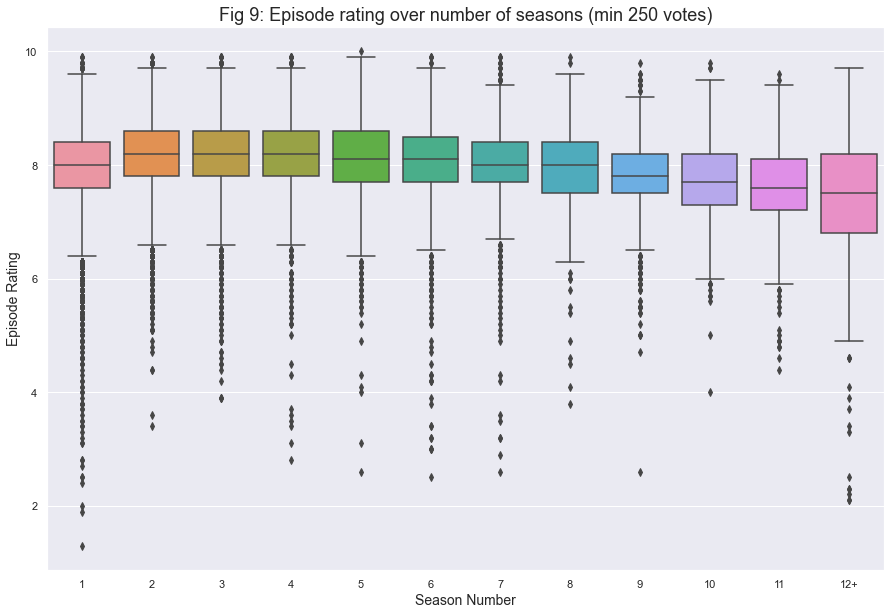

In [35]:
df = episodes_ratings[episodes_ratings['seasonNumber'] != '\\N']
df['seasonNumber'] = episodes_ratings[episodes_ratings['seasonNumber'] != '\\N']['seasonNumber'].astype(int)
df2 = df[df['numVotes'] >= 250]
df2['season'] = df2['seasonNumber'].apply(lambda x: str(x) if x < 13 else '12+')

order = ['1','2','3','4','5','6','7','8','9','10','11','12+']

fig = plt.figure(figsize=(15,10))
ax = sns.boxplot(x="season", y="averageRating", data=df2, order=order)
ax.set_xlabel("Season Number",fontsize=14)
ax.set_ylabel("Episode Rating",fontsize=14)
plt.title(label='Fig 9: Episode rating over number of seasons (min 250 votes)', fontsize=18)
fig.savefig('fig9.png', dpi=fig.dpi)

In [36]:
from bokeh.palettes import BuPu

df = tvseries_episodes_ratings_popular_full[tvseries_episodes_ratings_popular_full['median_before_peak'] >= 7]
#df = tvseries_episodes_ratings_popular_full
#df['size'] = df['log_numVotes']/2
#df['size'] = 7
df['size'] = 4+abs((df['median_before_peak'] - df['median_after_peak']))*10

#output_notebook()
output_file("fig10.html")

source = ColumnDataSource(data=df)

p = figure(plot_width=900, plot_height=600, tools=["box_zoom"], 
           title="Fig 10: Final season v/s Prior peak median rating (Interactive plot)")
#p.min_border_top = 300
#p.min_border_bottom = 100
p.js_on_event(DoubleTap, CustomJS(args=dict(p=p), code='p.reset.emit()'))

COLOR_FACTORS = ['1','2','3','4','5','6','7','8','9','10','11+']
MARKER_FACTORS = ['Size: Absolute rating difference - prior and post peak']
MARKERS = ['circle']

x = np.array(df['median_before_peak'])
y = np.array(df['last_season_median_rating'])

slope = 1
intercept = 0
## y = x
y_predicted = [slope*i + intercept  for i in x]

line = p.line(x, y_predicted, color='green')

scatter = p.scatter('median_before_peak', 'last_season_median_rating', size='size', source=source, alpha=0.5,
                  color=factor_cmap("seasonGroup", Magma[11], COLOR_FACTORS))

hover = HoverTool(tooltips=[
    ("Title", "@showTitle"),
    ("Seasons, Episodes, Rating", "@series_episodes_rating"),
    ("Peak Season", "@best_season"),
    ("Median, Mean episode rating", "@median_mean_rating"),
    ("Median before, after peak, final season", "@median_before_after_peak_finale")
], renderers=[scatter])

p.add_tools(hover)

# create an invisible renderer to drive color legend
rc = p.rect(x=7.2, y=9, height=1, width=1, color=Magma[11])
#rc.background_fill_color = "grey"
rc.visible = False

# add a color legend with explicit index, set labels to fit your need
legend = Legend(items=[
    LegendItem(label=COLOR_FACTORS[i], renderers=[rc], index=i) for i, c in enumerate(Magma[11])
], location="top_left")
legend.title = 'Number of Seasons'
p.add_layout(legend)

# create an invisible renderer to drive shape legend
rs = p.scatter(x=7, y=7, color="green", marker=MARKERS)
rs.visible = False

# add a shape legend with explicit index, set labels to fit your needs
legend = Legend(items=[
    LegendItem(label=MARKER_FACTORS[i], renderers=[rs], index=i) for i, s in enumerate(MARKER_FACTORS)
], location="bottom_left")
p.add_layout(legend)

p.title.align = 'center'
p.xaxis.axis_label = 'Median episode rating - before peak'
p.yaxis.axis_label = 'Median episode rating - final season'
p.background_fill_color = "grey"
p.xaxis.axis_label_text_font_size = "12pt"
p.yaxis.axis_label_text_font_size = "12pt"
p.title.text_font_size = '12pt'

show(p)

### 5) How good / bad was the finale?

In [37]:
tvseries_episodes_ratings_popular_full_top100 = tvseries_episodes_ratings_popular_full.sort_values(by='numVotes', ascending=False).head(n=100).reset_index()
tvseries_episodes_ratings_popular_full_top100.sort_values(by='primaryTitle', ascending=False, inplace=True)
tvseries_episodes_ratings_popular_full_top100['showTitle'] = tvseries_episodes_ratings_popular_full_top100["primaryTitle"] + " (" + tvseries_episodes_ratings_popular_full_top100["startYear"] + "-" + tvseries_episodes_ratings_popular_full_top100["endYear"] + ")"

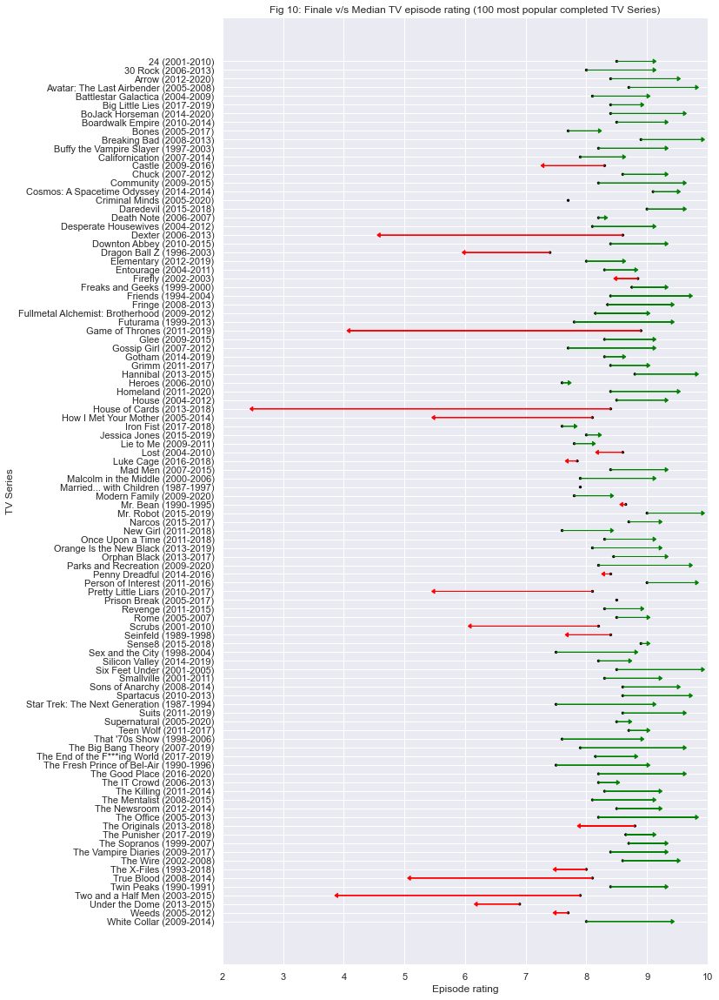

In [38]:
#initialize a plot
fig = plt.figure(figsize=(10,20))

#add start points
ax = sns.scatterplot(data=tvseries_episodes_ratings_popular_full_top100, 
                   x='median_averageRating', 
                   y='showTitle', 
                   size=5, 
                   color='black',
                   legend=False
                  )

#define arrows
arrow_starts = tvseries_episodes_ratings_popular_full_top100['median_averageRating'].values
arrow_lengths = tvseries_episodes_ratings_popular_full_top100['finale_rating'].values - arrow_starts

#add arrows to plot
for i, subject in enumerate(tvseries_episodes_ratings_popular_full_top100['showTitle']):
    if arrow_lengths[i] > 0.001:
        ax.arrow(arrow_starts[i],        #x start point
                 i,                      #y start point
                 arrow_lengths[i],       #change in x 
                 0,                      #change in y
                 head_width=0.5,         #arrow head width
                 head_length=0.05,        #arrow head length
                 width=0.01,              #arrow stem width
                 fc='green',             #arrow fill color
                 ec='green')             #arrow edge color
    elif arrow_lengths[i] < -0.001:
        ax.arrow(arrow_starts[i],        #x start point
                 i,                      #y start point
                 arrow_lengths[i],       #change in x 
                 0,                      #change in y
                 head_width=0.5,         #arrow head width
                 head_length=0.05,        #arrow head length
                 width=0.01,              #arrow stem width
                 fc='red',             #arrow fill color
                 ec='red')             #arrow edge color
    else:
        continue
        

#format plot
ax.set_title('Fig 10: Finale v/s Median TV episode rating (100 most popular completed TV Series)')   #add title
#ax.axvline(x=7, color='black', ls='--', lw=2, zorder=0) #add line at x=0
ax.grid(axis='y', color='white')                        #add a light grid
ax.set_xlim(2,10)                                     #set x axis limits
ax.set_xlabel('Episode rating')                                #label the x axis
ax.set_ylabel('TV Series')                          #label the y axis
sns.despine(left=True, bottom=True)                   #remove axes
#fig.savefig('fig10.png', dpi=fig.dpi)

### 6) Episode Rating Distribution (for 100 most popular completed series)

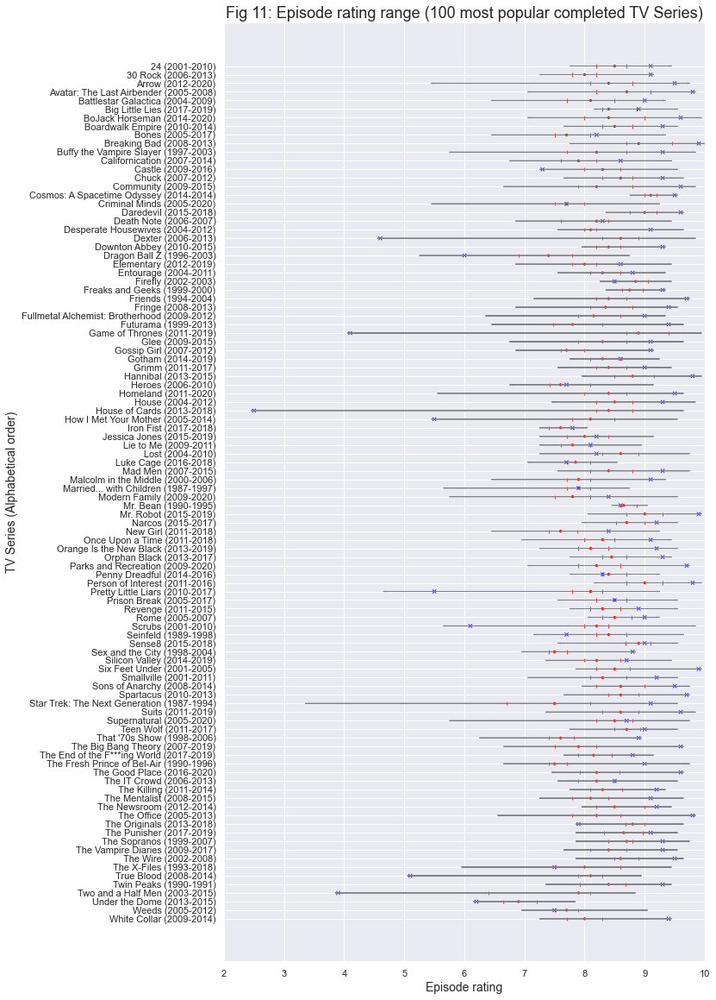

In [40]:
#initialize a plot
fig = plt.figure(figsize=(10,20))

# median rating
ax = sns.scatterplot(data=tvseries_episodes_ratings_popular_full_top100, 
                   x='median_averageRating', 
                   y='showTitle', 
                   size=5, 
                   color='red', legend=False)

# 1st quartile
ax = sns.scatterplot(data=tvseries_episodes_ratings_popular_full_top100, 
                   x='q1_averageRating', 
                   y='showTitle', 
                   size=5, 
                   color='red', legend=False, marker="|")

# 3rd quartile
ax = sns.scatterplot(data=tvseries_episodes_ratings_popular_full_top100, 
                   x='q3_averageRating', 
                   y='showTitle', 
                   size=5, 
                   color='red', legend=False, marker="|")

# finale
ax = sns.scatterplot(data=tvseries_episodes_ratings_popular_full_top100, 
                   x='finale_rating', 
                   y='showTitle', 
                   size=5, 
                   color='blue', legend=False, marker="x")

#ax = sns.scatterplot(data=tvseries_episodes_ratings_popular_full_top100, 
#                   x='pilot_rating', 
#                   y='showTitle', 
#                   size=10, 
#                   color='green', legend=False, marker="o")

#define arrows
arrow_starts1 = tvseries_episodes_ratings_popular_full_top100['median_averageRating'].values
arrow_lengths1 = tvseries_episodes_ratings_popular_full_top100['min_averageRating'].values - arrow_starts1

arrow_starts2 = tvseries_episodes_ratings_popular_full_top100['median_averageRating'].values
arrow_lengths2 = tvseries_episodes_ratings_popular_full_top100['max_averageRating'].values - arrow_starts2

#add arrows to plot
for i, subject in enumerate(tvseries_episodes_ratings_popular_full_top100['showTitle']):
    ax.arrow(arrow_starts2[i],        #x start point
                 i,                      #y start point
                 arrow_lengths2[i],       #change in x 
                 0,                      #change in y
                 head_width=0.05,         #arrow head width
                 head_length=0.05,        #arrow head length
                 width=0.01,              #arrow stem width
                 fc='grey',             #arrow fill color
                 ec='grey')             #arrow edge color
    
    ax.arrow(arrow_starts1[i],        #x start point
                 i,                      #y start point
                 arrow_lengths1[i],       #change in x 
                 0,                      #change in y
                 head_width=0.05,         #arrow head width
                 head_length=0.05,        #arrow head length
                 width=0.01,              #arrow stem width
                 fc='grey',             #arrow fill color
                 ec='grey')             #arrow edge color

#format plot
ax.set_title('Fig 11: Episode rating range (100 most popular completed TV Series)', fontsize=18)   #add title
#ax.axvline(x=7, color='0.9', ls='--', lw=2, zorder=0) #add line at x=0
ax.grid(axis='y', color='white')                        #add a light grid
ax.set_xlim(2,10)                                     #set x axis limits
ax.set_xlabel('Episode rating', fontsize=14)                                #label the x axis
ax.set_ylabel('TV Series (Alphabetical order)', fontsize=14)                          #label the y axis
sns.despine(left=True, bottom=True)                   #remove axes
#fig.savefig('fig11.png', dpi=fig.dpi)

### 7) Change in genres over time?

In [49]:
tvseries_with_genres[(tvseries_with_genres['startYear'] >= '2010') & (tvseries_with_genres['startYear'] < '2020')].describe(include='all')

,tconst,titleType,primaryTitle,originalTitle,isAdult,startYear,endYear,runtimeMinutes,all_genres,single_genre
count,125441,125441,125441,125441,125441.000,125441,125441,125441,125441,125441
unique,95731,2,92165,92443,nan,10,17,382,1145,27
top,tt1866426,tvSeries,Undercover,Roomies,nan,2017-01-01 00:00:00,\N,\N,Comedy,Comedy
freq,3,103973,17,16,nan,14893,93220,74496,19355,27802
first,NaN,NaN,NaN,NaN,nan,2010-01-01 00:00:00,NaN,NaN,NaN,NaN
last,NaN,NaN,NaN,NaN,nan,2019-01-01 00:00:00,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,NaN,0.007,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,0.081,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,0.000,NaN,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,0.000,NaN,NaN,NaN,NaN,NaN


In [68]:
tvseries_b4_2k = tvseries_with_genres[tvseries_with_genres['startYear'] < '2000'].groupby('single_genre')[['tconst']].count().reset_index().sort_values(by='tconst', ascending=False)
tvseries_b4_2k['tconst'] = tvseries_b4_2k['tconst']/44698*100

tvseries_aft_2k = tvseries_with_genres[tvseries_with_genres['startYear'] >= '2000'].groupby('single_genre')[['tconst']].count().reset_index().sort_values(by='tconst', ascending=False)
tvseries_aft_2k['tconst'] = tvseries_aft_2k['tconst']/139621*100

tvseries_1950dec = tvseries_with_genres[(tvseries_with_genres['startYear'] >= '1950') & (tvseries_with_genres['startYear'] < '1960')].groupby('single_genre')[['tconst']].count().reset_index().sort_values(by='tconst', ascending=False)
tvseries_1950dec['tconst'] = tvseries_1950dec['tconst']/3319*100

tvseries_1960dec = tvseries_with_genres[(tvseries_with_genres['startYear'] >= '1960') & (tvseries_with_genres['startYear'] < '1970')].groupby('single_genre')[['tconst']].count().reset_index().sort_values(by='tconst', ascending=False)
tvseries_1960dec['tconst'] = tvseries_1960dec['tconst']/5725*100

tvseries_1970dec = tvseries_with_genres[(tvseries_with_genres['startYear'] >= '1970') & (tvseries_with_genres['startYear'] < '1980')].groupby('single_genre')[['tconst']].count().reset_index().sort_values(by='tconst', ascending=False)
tvseries_1970dec['tconst'] = tvseries_1970dec['tconst']/7498*100

tvseries_1980dec = tvseries_with_genres[(tvseries_with_genres['startYear'] >= '1980') & (tvseries_with_genres['startYear'] < '1990')].groupby('single_genre')[['tconst']].count().reset_index().sort_values(by='tconst', ascending=False)
tvseries_1980dec['tconst'] = tvseries_1980dec['tconst']/10450*100

tvseries_1990dec = tvseries_with_genres[(tvseries_with_genres['startYear'] >= '1990') & (tvseries_with_genres['startYear'] < '2000')].groupby('single_genre')[['tconst']].count().reset_index().sort_values(by='tconst', ascending=False)
tvseries_1990dec['tconst'] = tvseries_1990dec['tconst']/17182*100

tvseries_2000dec = tvseries_with_genres[(tvseries_with_genres['startYear'] >= '2000') & (tvseries_with_genres['startYear'] < '2010')].groupby('single_genre')[['tconst']].count().reset_index().sort_values(by='tconst', ascending=False)
tvseries_2000dec['tconst'] = tvseries_2000dec['tconst']/39772*100

tvseries_2010dec = tvseries_with_genres[(tvseries_with_genres['startYear'] >= '2010') & (tvseries_with_genres['startYear'] < '2020')].groupby('single_genre')[['tconst']].count().reset_index().sort_values(by='tconst', ascending=False)
tvseries_2010dec['tconst'] = tvseries_2010dec['tconst']/95731*100

tvseries_1950_60 = pd.merge(tvseries_1950dec, tvseries_1960dec, on='single_genre', how='outer')
tvseries_1950_60.rename(columns={'single_genre':'genres', 'tconst_x':'prop_1950dec', 'tconst_y':'prop_1960dec'}, inplace=True)

tvseries_1960_70 = pd.merge(tvseries_1960dec, tvseries_1970dec, on='single_genre', how='outer')
tvseries_1960_70.rename(columns={'single_genre':'genres', 'tconst_x':'prop_1960dec', 'tconst_y':'prop_1970dec'}, inplace=True)

tvseries_1970_80 = pd.merge(tvseries_1970dec, tvseries_1980dec, on='single_genre', how='outer')
tvseries_1970_80.rename(columns={'single_genre':'genres', 'tconst_x':'prop_1970dec', 'tconst_y':'prop_1980dec'}, inplace=True)

tvseries_1980_90 = pd.merge(tvseries_1980dec, tvseries_1990dec, on='single_genre', how='outer')
tvseries_1980_90.rename(columns={'single_genre':'genres', 'tconst_x':'prop_1980dec', 'tconst_y':'prop_1990dec'}, inplace=True)

tvseries_1990_2k = pd.merge(tvseries_1990dec, tvseries_2000dec, on='single_genre', how='outer')
tvseries_1990_2k.rename(columns={'single_genre':'genres', 'tconst_x':'prop_1990dec', 'tconst_y':'prop_2000dec'}, inplace=True)

tvseries_2k_2010 = pd.merge(tvseries_2000dec, tvseries_2010dec, on='single_genre', how='outer')
tvseries_2k_2010.rename(columns={'single_genre':'genres', 'tconst_x':'prop_2000dec', 'tconst_y':'prop_2010dec'}, inplace=True)

tvseries_1990_2010 = pd.merge(tvseries_1990dec, tvseries_2010dec, on='single_genre', how='outer')
tvseries_1990_2010.rename(columns={'single_genre':'genres', 'tconst_x':'prop_1990dec', 'tconst_y':'prop_2010dec'}, inplace=True)

tvseries_full = pd.merge(tvseries_b4_2k, tvseries_aft_2k, on='single_genre', how='outer')
tvseries_full.rename(columns={'single_genre':'genres', 'tconst_x':'prop_b4_2k', 'tconst_y':'prop_after_2k'}, inplace=True)


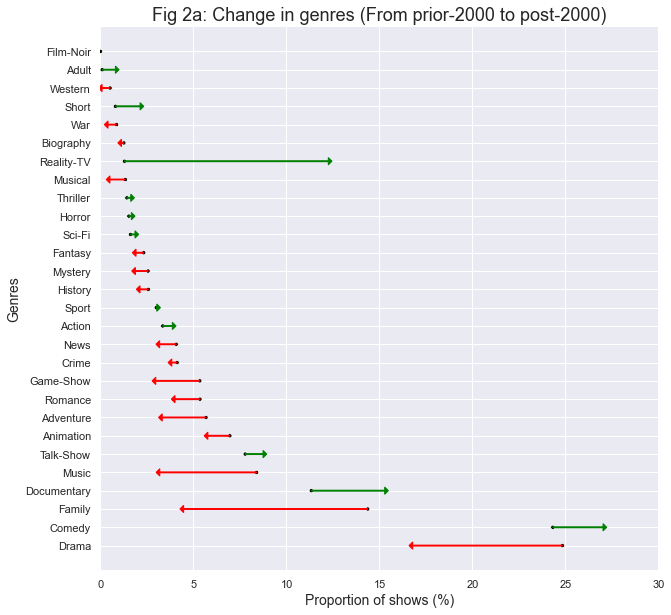

In [71]:
#initialize a plot
ax = plt.figure(figsize=(10,10))

#add start points
ax = sns.scatterplot(data=tvseries_full, 
                   x='prop_b4_2k', 
                   y='genres',
                   size=5,
                   color='black',
                   legend=False)

#define arrows
arrow_starts = tvseries_full['prop_b4_2k'].values
arrow_lengths = tvseries_full['prop_after_2k'].values - arrow_starts

#add arrows to plot
for i, subject in enumerate(tvseries_full['genres']):
    if arrow_lengths[i] > 0:
        ax.arrow(arrow_starts[i],        #x start point
                 i,                      #y start point
                 arrow_lengths[i],       #change in x 
                 0,                      #change in y
                 head_width=0.4,         #arrow head width
                 head_length=0.2,        #arrow head length
                 width=0.05,              #arrow stem width
                 fc='green',             #arrow fill color
                 ec='green')             #arrow edge color
    elif arrow_lengths[i] < 0:
        ax.arrow(arrow_starts[i],        #x start point
                 i,                      #y start point
                 arrow_lengths[i],       #change in x 
                 0,                      #change in y
                 head_width=0.4,         #arrow head width
                 head_length=0.2,        #arrow head length
                 width=0.05,              #arrow stem width
                 fc='red',             #arrow fill color
                 ec='red')             #arrow edge color
    else:
        continue

#format plot
ax.set_title('Fig 2a: Change in genres (From prior-2000 to post-2000)', fontsize=18)   #add title
ax.grid(axis='y', color='white')                        #add a light grid
ax.set_xlim(0,30)                                     #set x axis limits

ax.set_xlabel('Proportion of shows (%)', fontsize=14)                                #label the x axis
ax.set_ylabel('Genres', fontsize=14)                          #label the y axis
sns.despine(left=True, bottom=True)                   #remove axes

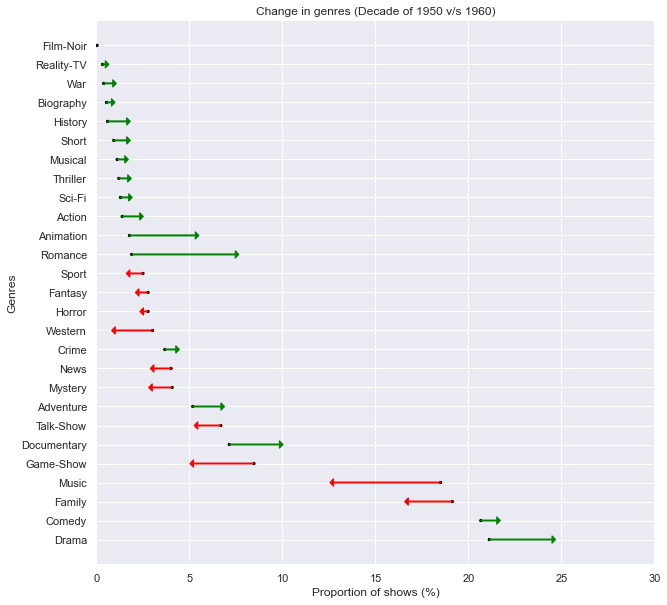

In [59]:
#initialize a plot
ax = plt.figure(figsize=(10,10))

#add start points
ax = sns.scatterplot(data=tvseries_1950_60, 
                   x='prop_1950dec', 
                   y='genres',
                   size=5,
                   color='black',
                   legend=False)

#define arrows
arrow_starts = tvseries_1950_60['prop_1950dec'].values
arrow_lengths = tvseries_1950_60['prop_1960dec'].values - arrow_starts

#add arrows to plot
for i, subject in enumerate(tvseries_1950_60['genres']):
    if arrow_lengths[i] > 0:
        ax.arrow(arrow_starts[i],        #x start point
                 i,                      #y start point
                 arrow_lengths[i],       #change in x 
                 0,                      #change in y
                 head_width=0.4,         #arrow head width
                 head_length=0.2,        #arrow head length
                 width=0.05,              #arrow stem width
                 fc='green',             #arrow fill color
                 ec='green')             #arrow edge color
    elif arrow_lengths[i] < 0:
        ax.arrow(arrow_starts[i],        #x start point
                 i,                      #y start point
                 arrow_lengths[i],       #change in x 
                 0,                      #change in y
                 head_width=0.4,         #arrow head width
                 head_length=0.2,        #arrow head length
                 width=0.05,              #arrow stem width
                 fc='red',             #arrow fill color
                 ec='red')             #arrow edge color
    else:
        continue

#format plot
ax.set_title('Change in genres (Decade of 1950 v/s 1960)')   #add title
ax.grid(axis='y', color='white')                        #add a light grid
ax.set_xlim(0,30)                                     #set x axis limits
ax.set_xlabel('Proportion of shows (%)')                                #label the x axis
ax.set_ylabel('Genres')                          #label the y axis
sns.despine(left=True, bottom=True)                   #remove axes

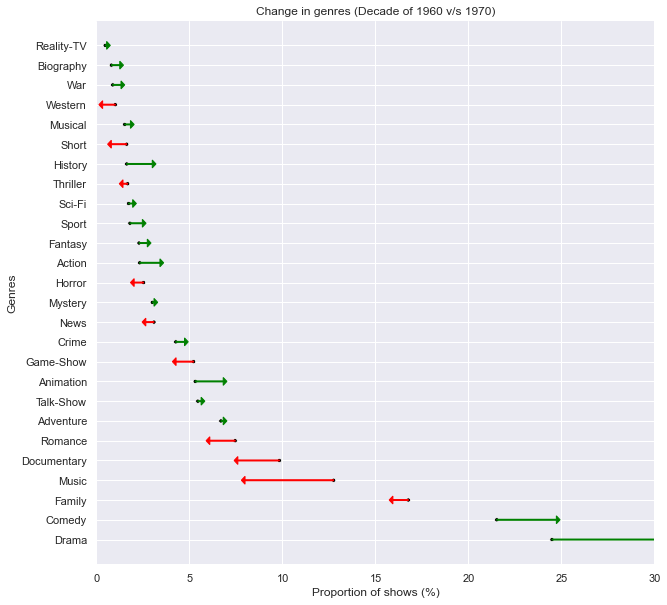

In [62]:
#initialize a plot
ax = plt.figure(figsize=(10,10))

#add start points
ax = sns.scatterplot(data=tvseries_1960_70, 
                   x='prop_1960dec', 
                   y='genres',
                   size=5,
                   color='black',
                   legend=False)

#define arrows
arrow_starts = tvseries_1960_70['prop_1960dec'].values
arrow_lengths = tvseries_1960_70['prop_1970dec'].values - arrow_starts

#add arrows to plot
for i, subject in enumerate(tvseries_1960_70['genres']):
    if arrow_lengths[i] > 0:
        ax.arrow(arrow_starts[i],        #x start point
                 i,                      #y start point
                 arrow_lengths[i],       #change in x 
                 0,                      #change in y
                 head_width=0.4,         #arrow head width
                 head_length=0.2,        #arrow head length
                 width=0.05,              #arrow stem width
                 fc='green',             #arrow fill color
                 ec='green')             #arrow edge color
    elif arrow_lengths[i] < 0:
        ax.arrow(arrow_starts[i],        #x start point
                 i,                      #y start point
                 arrow_lengths[i],       #change in x 
                 0,                      #change in y
                 head_width=0.4,         #arrow head width
                 head_length=0.2,        #arrow head length
                 width=0.05,              #arrow stem width
                 fc='red',             #arrow fill color
                 ec='red')             #arrow edge color
    else:
        continue

#format plot
ax.set_title('Change in genres (Decade of 1960 v/s 1970)')   #add title
ax.grid(axis='y', color='white')                        #add a light grid
ax.set_xlim(0,30)                                     #set x axis limits
ax.set_xlabel('Proportion of shows (%)')                                #label the x axis
ax.set_ylabel('Genres')                          #label the y axis
sns.despine(left=True, bottom=True)                   #remove axes

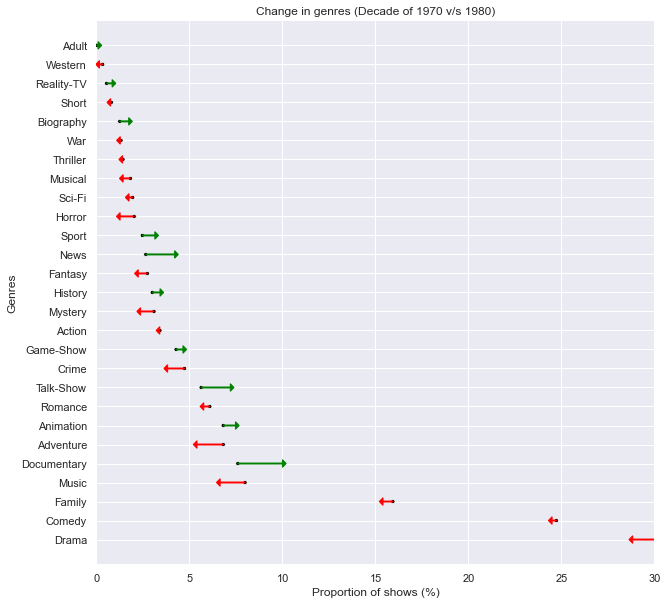

In [63]:
#initialize a plot
ax = plt.figure(figsize=(10,10))

#add start points
ax = sns.scatterplot(data=tvseries_1970_80, 
                   x='prop_1970dec', 
                   y='genres',
                   size=5,
                   color='black',
                   legend=False)

#define arrows
arrow_starts = tvseries_1970_80['prop_1970dec'].values
arrow_lengths = tvseries_1970_80['prop_1980dec'].values - arrow_starts

#add arrows to plot
for i, subject in enumerate(tvseries_1970_80['genres']):
    if arrow_lengths[i] > 0:
        ax.arrow(arrow_starts[i],        #x start point
                 i,                      #y start point
                 arrow_lengths[i],       #change in x 
                 0,                      #change in y
                 head_width=0.4,         #arrow head width
                 head_length=0.2,        #arrow head length
                 width=0.05,              #arrow stem width
                 fc='green',             #arrow fill color
                 ec='green')             #arrow edge color
    elif arrow_lengths[i] < 0:
        ax.arrow(arrow_starts[i],        #x start point
                 i,                      #y start point
                 arrow_lengths[i],       #change in x 
                 0,                      #change in y
                 head_width=0.4,         #arrow head width
                 head_length=0.2,        #arrow head length
                 width=0.05,              #arrow stem width
                 fc='red',             #arrow fill color
                 ec='red')             #arrow edge color
    else:
        continue

#format plot
ax.set_title('Change in genres (Decade of 1970 v/s 1980)')   #add title
ax.grid(axis='y', color='white')                        #add a light grid
ax.set_xlim(0,30)                                     #set x axis limits
ax.set_xlabel('Proportion of shows (%)')                                #label the x axis
ax.set_ylabel('Genres')                          #label the y axis
sns.despine(left=True, bottom=True)                   #remove axes

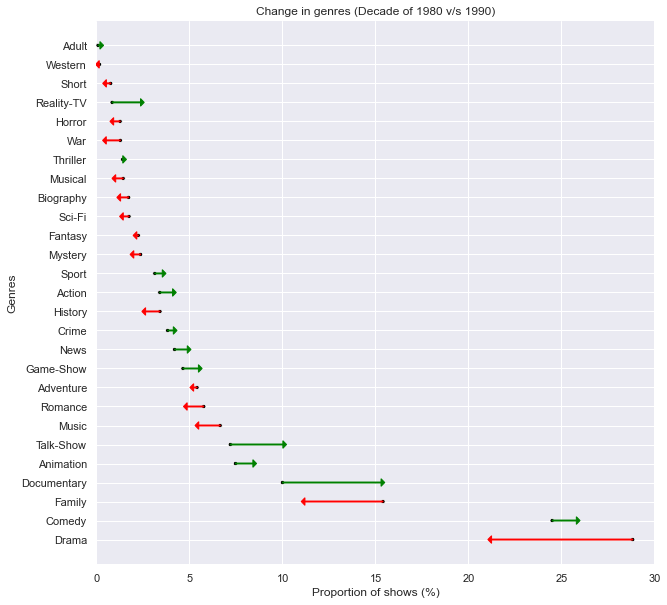

In [64]:
#initialize a plot
ax = plt.figure(figsize=(10,10))

#add start points
ax = sns.scatterplot(data=tvseries_1980_90, 
                   x='prop_1980dec', 
                   y='genres',
                   size=5,
                   color='black',
                   legend=False)

#define arrows
arrow_starts = tvseries_1980_90['prop_1980dec'].values
arrow_lengths = tvseries_1980_90['prop_1990dec'].values - arrow_starts

#add arrows to plot
for i, subject in enumerate(tvseries_1980_90['genres']):
    if arrow_lengths[i] > 0:
        ax.arrow(arrow_starts[i],        #x start point
                 i,                      #y start point
                 arrow_lengths[i],       #change in x 
                 0,                      #change in y
                 head_width=0.4,         #arrow head width
                 head_length=0.2,        #arrow head length
                 width=0.05,              #arrow stem width
                 fc='green',             #arrow fill color
                 ec='green')             #arrow edge color
    elif arrow_lengths[i] < 0:
        ax.arrow(arrow_starts[i],        #x start point
                 i,                      #y start point
                 arrow_lengths[i],       #change in x 
                 0,                      #change in y
                 head_width=0.4,         #arrow head width
                 head_length=0.2,        #arrow head length
                 width=0.05,              #arrow stem width
                 fc='red',             #arrow fill color
                 ec='red')             #arrow edge color
    else:
        continue

#format plot
ax.set_title('Change in genres (Decade of 1980 v/s 1990)')   #add title
ax.grid(axis='y', color='white')                        #add a light grid
ax.set_xlim(0,30)                                     #set x axis limits
ax.set_xlabel('Proportion of shows (%)')                                #label the x axis
ax.set_ylabel('Genres')                          #label the y axis
sns.despine(left=True, bottom=True)                   #remove axes

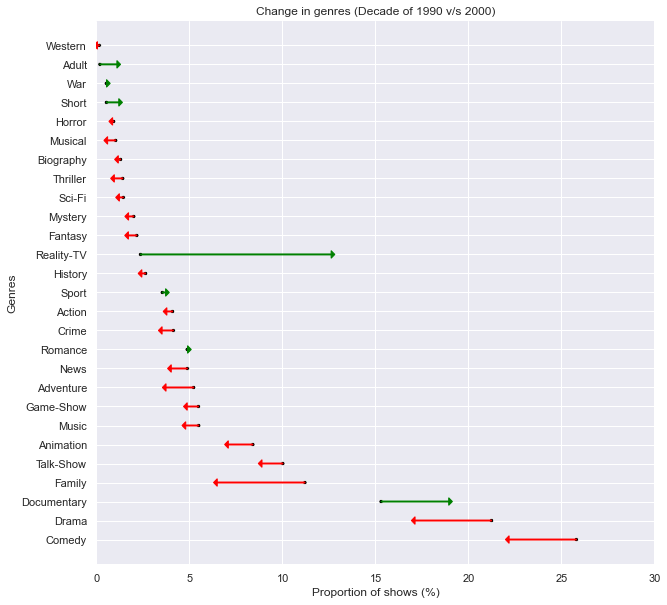

In [65]:
#initialize a plot
ax = plt.figure(figsize=(10,10))

#add start points
ax = sns.scatterplot(data=tvseries_1990_2k, 
                   x='prop_1990dec', 
                   y='genres',
                   size=5,
                   color='black',
                   legend=False)

#define arrows
arrow_starts = tvseries_1990_2k['prop_1990dec'].values
arrow_lengths = tvseries_1990_2k['prop_2000dec'].values - arrow_starts

#add arrows to plot
for i, subject in enumerate(tvseries_1990_2k['genres']):
    if arrow_lengths[i] > 0:
        ax.arrow(arrow_starts[i],        #x start point
                 i,                      #y start point
                 arrow_lengths[i],       #change in x 
                 0,                      #change in y
                 head_width=0.4,         #arrow head width
                 head_length=0.2,        #arrow head length
                 width=0.05,              #arrow stem width
                 fc='green',             #arrow fill color
                 ec='green')             #arrow edge color
    elif arrow_lengths[i] < 0:
        ax.arrow(arrow_starts[i],        #x start point
                 i,                      #y start point
                 arrow_lengths[i],       #change in x 
                 0,                      #change in y
                 head_width=0.4,         #arrow head width
                 head_length=0.2,        #arrow head length
                 width=0.05,              #arrow stem width
                 fc='red',             #arrow fill color
                 ec='red')             #arrow edge color
    else:
        continue

#format plot
ax.set_title('Change in genres (Decade of 1990 v/s 2000)')   #add title
ax.grid(axis='y', color='white')                        #add a light grid
ax.set_xlim(0,30)                                     #set x axis limits
ax.set_xlabel('Proportion of shows (%)')                                #label the x axis
ax.set_ylabel('Genres')                          #label the y axis
sns.despine(left=True, bottom=True)                   #remove axes

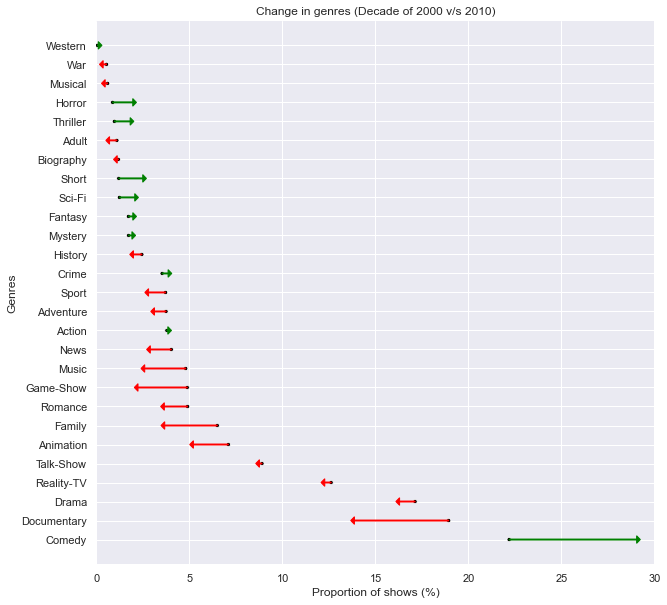

In [66]:
#initialize a plot
ax = plt.figure(figsize=(10,10))

#add start points
ax = sns.scatterplot(data=tvseries_2k_2010, 
                   x='prop_2000dec', 
                   y='genres',
                   size=5,
                   color='black',
                   legend=False)

#define arrows
arrow_starts = tvseries_2k_2010['prop_2000dec'].values
arrow_lengths = tvseries_2k_2010['prop_2010dec'].values - arrow_starts

#add arrows to plot
for i, subject in enumerate(tvseries_2k_2010['genres']):
    if arrow_lengths[i] > 0:
        ax.arrow(arrow_starts[i],        #x start point
                 i,                      #y start point
                 arrow_lengths[i],       #change in x 
                 0,                      #change in y
                 head_width=0.4,         #arrow head width
                 head_length=0.2,        #arrow head length
                 width=0.05,              #arrow stem width
                 fc='green',             #arrow fill color
                 ec='green')             #arrow edge color
    elif arrow_lengths[i] < 0:
        ax.arrow(arrow_starts[i],        #x start point
                 i,                      #y start point
                 arrow_lengths[i],       #change in x 
                 0,                      #change in y
                 head_width=0.4,         #arrow head width
                 head_length=0.2,        #arrow head length
                 width=0.05,              #arrow stem width
                 fc='red',             #arrow fill color
                 ec='red')             #arrow edge color
    else:
        continue

#format plot
ax.set_title('Change in genres (Decade of 2000 v/s 2010)')   #add title
ax.grid(axis='y', color='white')                        #add a light grid
ax.set_xlim(0,30)                                     #set x axis limits
ax.set_xlabel('Proportion of shows (%)')                                #label the x axis
ax.set_ylabel('Genres')                          #label the y axis
sns.despine(left=True, bottom=True)                   #remove axes

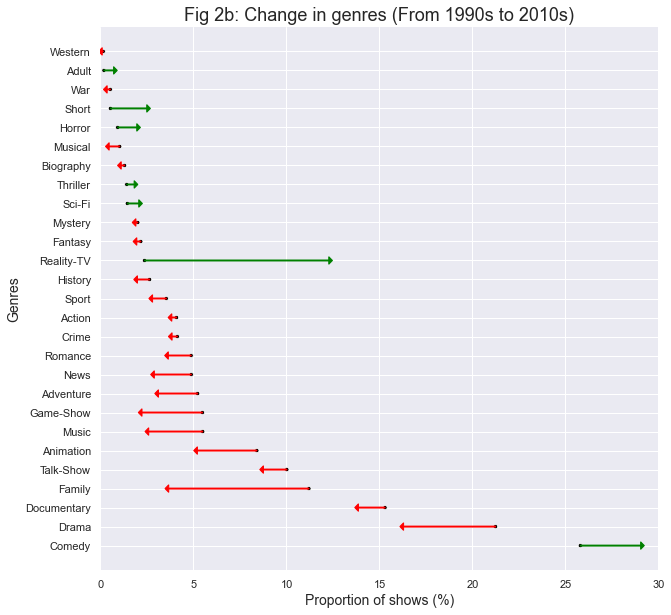

In [73]:
#initialize a plot
ax = plt.figure(figsize=(10,10))

#add start points
ax = sns.scatterplot(data=tvseries_1990_2010, 
                   x='prop_1990dec', 
                   y='genres',
                   size=5,
                   color='black',
                   legend=False)

#define arrows
arrow_starts = tvseries_1990_2010['prop_1990dec'].values
arrow_lengths = tvseries_1990_2010['prop_2010dec'].values - arrow_starts

#add arrows to plot
for i, subject in enumerate(tvseries_1990_2010['genres']):
    if arrow_lengths[i] > 0:
        ax.arrow(arrow_starts[i],        #x start point
                 i,                      #y start point
                 arrow_lengths[i],       #change in x 
                 0,                      #change in y
                 head_width=0.4,         #arrow head width
                 head_length=0.2,        #arrow head length
                 width=0.05,              #arrow stem width
                 fc='green',             #arrow fill color
                 ec='green')             #arrow edge color
    elif arrow_lengths[i] < 0:
        ax.arrow(arrow_starts[i],        #x start point
                 i,                      #y start point
                 arrow_lengths[i],       #change in x 
                 0,                      #change in y
                 head_width=0.4,         #arrow head width
                 head_length=0.2,        #arrow head length
                 width=0.05,              #arrow stem width
                 fc='red',             #arrow fill color
                 ec='red')             #arrow edge color
    else:
        continue

#format plot
ax.set_title('Fig 2b: Change in genres (From 1990s to 2010s)', fontsize=18)   #add title
ax.grid(axis='y', color='white')                        #add a light grid
ax.set_xlim(0,30)                                     #set x axis limits
ax.set_xlabel('Proportion of shows (%)', fontsize=14)                                #label the x axis
ax.set_ylabel('Genres', fontsize=14)                          #label the y axis
sns.despine(left=True, bottom=True)                   #remove axes

### 8) New shows / episodes over time

In [199]:
basics_episodes2 = pd.merge(basics_episodes, episodes, on='tconst')
basics_episodes2 = basics_episodes2[['tconst','startYear','parentTconst','seasonNumber','episodeNumber']]
episodes_tvseries_full = pd.merge(basics_episodes2, tvseries, left_on='parentTconst', right_on='tconst')
episodes_tvseries_full.rename(columns={'tconst_x':'episode_id','startYear_x':'episode_year','tconst_y':'series_id',
                                       'startYear_y':'series_year'}, inplace=True)
episodes_tvseries_full = episodes_tvseries_full[['episode_id','episode_year','series_id','series_year','seasonNumber','episodeNumber','titleType']]
episodes_tvseries_full = episodes_tvseries_full[episodes_tvseries_full['series_year'] != '\\N']

episodes_tvseries_full = episodes_tvseries_full[(episodes_tvseries_full['episode_year'] != '\\N') & 
                                                (episodes_tvseries_full['series_year'] != '\\N') & 
                                                (episodes_tvseries_full['seasonNumber'] != '\\N') & 
                                                (episodes_tvseries_full['episodeNumber'] != '\\N')]

episodes_tvseries_full['episode_year'] = pd.to_datetime(episodes_tvseries_full['episode_year'], format='%Y')
episodes_tvseries_full['series_year'] = pd.to_datetime(episodes_tvseries_full['series_year'], format='%Y')

episodes_tvseries_full = episodes_tvseries_full[episodes_tvseries_full['episode_year'] >= 
                                                  episodes_tvseries_full['series_year']]
episodes_tvseries_full[['seasonNumber', 'episodeNumber']] = episodes_tvseries_full[['seasonNumber', 'episodeNumber']].astype(int)
episodes_tvseries_full.describe(include='all')

,episode_id,episode_year,series_id,series_year,seasonNumber,episodeNumber,titleType
count,3420610,3420610,3420610,3420610,3420610.000,3420610.000,3420610
unique,3420610,111,116224,94,nan,nan,2
top,tt5310944,2017-01-01 00:00:00,tt0058796,2013-01-01 00:00:00,nan,nan,tvSeries
freq,1,211398,11337,159964,nan,nan,3318729
first,NaN,1906-01-01 00:00:00,NaN,1906-01-01 00:00:00,nan,nan,NaN
last,NaN,2026-01-01 00:00:00,NaN,2024-01-01 00:00:00,nan,nan,NaN
mean,NaN,NaN,NaN,NaN,3.906,268.029,NaN
std,NaN,NaN,NaN,NaN,21.906,1180.305,NaN
min,NaN,NaN,NaN,NaN,1.000,0.000,NaN
25%,NaN,NaN,NaN,NaN,1.000,6.000,NaN


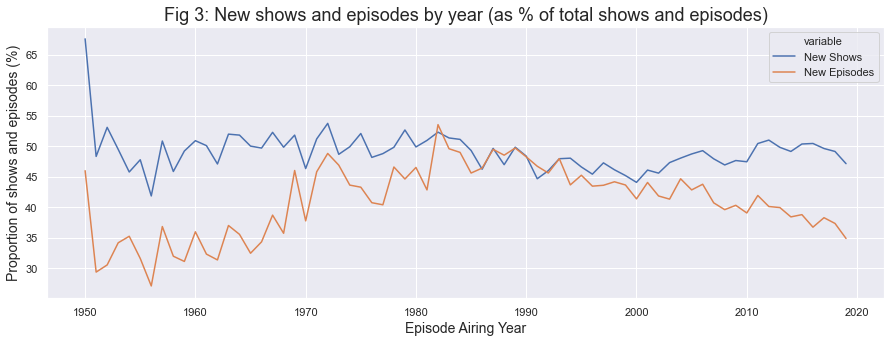

In [219]:
episodes_tvseries_full['New Episodes'] = (episodes_tvseries_full['episode_year'] == episodes_tvseries_full['series_year']).apply(lambda x: 1 if x else 0)

tvseries_group = episodes_tvseries_full.groupby(['series_id','episode_year','series_year'])['New Episodes'].count().reset_index()
tvseries_group['New Shows'] = (tvseries_group['episode_year'] == tvseries_group['series_year']).apply(lambda x: 1 if x else 0)

# proportion of new shows over total shows in a year
df = tvseries_group.groupby('episode_year')['New Shows'].mean().reset_index()
# proportion of new episodes over total episodes in a year
df2 = episodes_tvseries_full.groupby('episode_year')['New Episodes'].mean().reset_index()

df3 = pd.merge(df, df2, on=['episode_year'])
df3[['New Shows', 'New Episodes']] = df3[['New Shows', 'New Episodes']]*100
df4 = df3[(df3['episode_year'] >= '1950') & (df3['episode_year'] <= '2019')]


other_years = episodes_tvseries_full[episodes_tvseries_full['episode_year'] != episodes_tvseries_full['series_year']].groupby(['episode_year','series_id'])['episode_id'].count().reset_index()
df5 = other_years.groupby('episode_year').agg({'episode_id' : ['count','sum']}).reset_index()
df5.columns = df5.columns.droplevel(0)
df5.rename(columns={'':'episode_year'}, inplace=True)
df5['Non-first year TV Show'] = df5['sum']/df5['count']
df5 = df5[['episode_year','Non-first year TV Show']]

first_year = episodes_tvseries_full[episodes_tvseries_full['episode_year'] == episodes_tvseries_full['series_year']].groupby(['episode_year','series_id'])['episode_id'].count().reset_index()
df6 = first_year.groupby('episode_year').agg({'episode_id' : ['count','sum']}).reset_index()
df6.columns = df6.columns.droplevel(0)
df6.rename(columns={'':'episode_year'}, inplace=True)
df6['First year TV Show'] = df6['sum']/df6['count']
df6 = df6[['episode_year','First year TV Show']]

df7 = pd.merge(df5, df6, on='episode_year')
df8 = df7[(df7['episode_year'] >= '1950') & (df7['episode_year'] <= '2019')]
#df9 = df

fig = plt.figure(figsize=(15,5))
#plt.subplot(2,1,1)
ax = sns.lineplot(x='episode_year', y='value', hue='variable', data=pd.melt(df4, ['episode_year']))
ax.set_xlabel('Episode Airing Year', fontsize=14)                                
ax.set_ylabel('Proportion of shows and episodes (%)', fontsize=14)                          
plt.title(label='Fig 3: New shows and episodes by year (as % of total shows and episodes)', fontsize=18)
fig.savefig('fig2.3.png', dpi=fig.dpi)

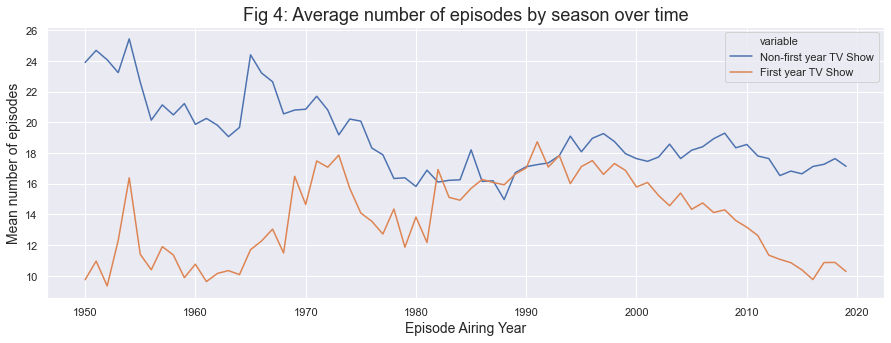

In [220]:
fig = plt.figure(figsize=(15,5))
ax = sns.lineplot(x='episode_year', y='value', hue='variable', data=pd.melt(df8, ['episode_year']))
ax.set_xlabel('Episode Airing Year', fontsize=14)                                
ax.set_ylabel('Mean number of episodes', fontsize=14)                          
plt.title(label='Fig 4: Average number of episodes by season over time', fontsize=18)
fig.savefig('fig2.4.png', dpi=fig.dpi)

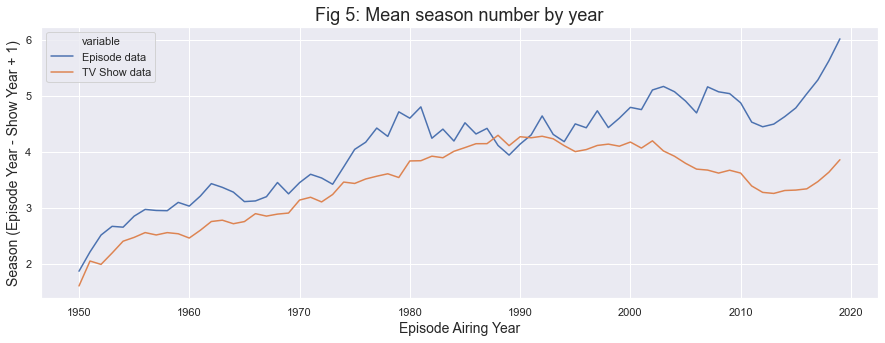

In [221]:
df = episodes_tvseries_full.copy()
df['Episode data'] = 1 + ((df['episode_year'] - df['series_year'])/ np.timedelta64(1, 'Y'))
df2 = episodes_tvseries_full.groupby(['episode_year','series_year','series_id'])['episode_id'].count().reset_index()
df2['TV Show data'] = 1 + ((df2['episode_year'] - df2['series_year'])/ np.timedelta64(1, 'Y'))

df3 = df.groupby('episode_year')[['Episode data']].mean().reset_index()
df4 = df2.groupby('episode_year')[['TV Show data']].mean().reset_index()
df5 = pd.merge(df3, df4, on='episode_year')
df6 = df5[(df5['episode_year'] >= '1950') & (df5['episode_year'] <= '2019')]

fig = plt.figure(figsize=(15,5))
ax = sns.lineplot(x='episode_year', y='value', hue='variable', data=pd.melt(df6, ['episode_year']))
ax.set_xlabel('Episode Airing Year', fontsize=14)                                
ax.set_ylabel('Season (Episode Year - Show Year + 1)', fontsize=14)                          
plt.title(label='Fig 5: Mean season number by year', fontsize=18)
fig.savefig('fig2.5.png', dpi=fig.dpi)

### 9) Actor / actress age over time

In [212]:
principals_actors_only = principals[(principals['ordering'] == 1) & ((principals['category'] == 'actor') | (principals['category'] == 'actress'))]
principals_names = pd.merge(principals_actors_only, names, on='nconst')
principals_names_mod = principals_names[principals_names['birthYear'] != '\\N']
episodes_principals = pd.merge(episodes_tvseries_full, principals_names_mod, left_on='episode_id', right_on='tconst')
episodes_principals['birthYear'] = pd.to_datetime(episodes_principals['birthYear'], format='%Y')
episodes_principals['age'] = (episodes_principals['episode_year'] - episodes_principals['birthYear'])/ np.timedelta64(1, 'Y')
episodes_principals = episodes_principals[(episodes_principals['age'] > 0) & (episodes_principals['age'] < 95)]
episodes_principals.describe(include='all')

,episode_id,episode_year,series_id,series_year,seasonNumber,episodeNumber,titleType,New Episodes,tconst,ordering,nconst,category,job,characters,primaryName,birthYear,deathYear,primaryProfession,knownForTitles,age
count,1337775,1337775,1337775,1337775,1337775.000,1337775.000,1337775,1337775.000,1337775,1337775.000,1337775,1337775,1337775,1337775,1337775,1337775,1337775,1336814,1337775,1337775.000
unique,1337775,81,46288,81,nan,nan,2,nan,1337775,nan,53818,2,1,90635,53589,145,76,1532,53694,nan
top,tt10591478,2017-01-01 00:00:00,tt0058796,2013-01-01 00:00:00,nan,nan,tvSeries,nan,tt10591478,nan,nm0368990,actor,\N,\N,Rohini Hattangadi,1974-01-01 00:00:00,\N,actress,"tt0088031,tt0083987,tt0098999,tt0374887",nan
freq,1,46985,10287,42205,nan,nan,1300207,nan,1,nan,3199,743521,1337775,82938,3199,31020,1090834,308791,3199,nan
first,NaN,1936-01-01 00:00:00,NaN,1930-01-01 00:00:00,nan,nan,NaN,nan,NaN,nan,NaN,NaN,NaN,NaN,NaN,1857-01-01 00:00:00,NaN,NaN,NaN,nan
last,NaN,2022-01-01 00:00:00,NaN,2021-01-01 00:00:00,nan,nan,NaN,nan,NaN,nan,NaN,NaN,NaN,NaN,NaN,2013-01-01 00:00:00,NaN,NaN,NaN,nan
mean,NaN,NaN,NaN,NaN,2.433,437.524,NaN,0.457,NaN,1.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,39.088
std,NaN,NaN,NaN,NaN,7.467,1627.603,NaN,0.498,NaN,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13.462
min,NaN,NaN,NaN,NaN,1.000,0.000,NaN,0.000,NaN,1.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.999
25%,NaN,NaN,NaN,NaN,1.000,7.000,NaN,0.000,NaN,1.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,29.000


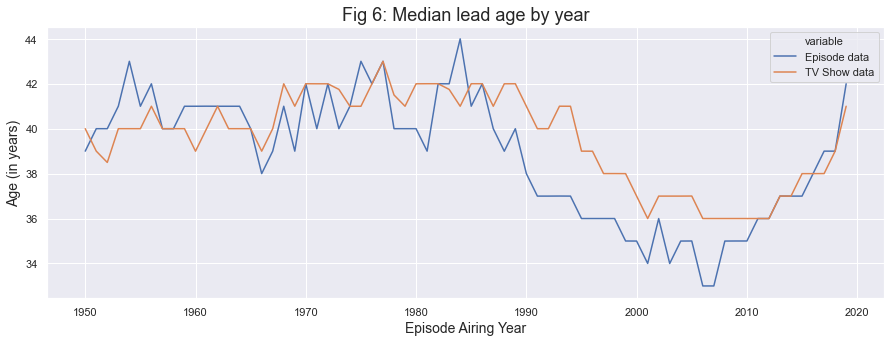

In [218]:
df = episodes_principals.groupby('episode_year')['age'].median().reset_index()
df.rename(columns={'age':'Episode data'}, inplace=True)
df2 = episodes_principals.groupby(['series_id','episode_year'])['age'].median().reset_index()
df3 = df2.groupby('episode_year')['age'].median().reset_index()
df3.rename(columns={'age':'TV Show data'}, inplace=True)
df4 = pd.merge(df, df3, on='episode_year')
df5 = df4[(df4['episode_year'] >= '1950') & (df4['episode_year'] <= '2019')]

fig = plt.figure(figsize=(15,5))
ax = sns.lineplot(x='episode_year', y='value', hue='variable', data=pd.melt(df5, ['episode_year']))
ax.set_xlabel('Episode Airing Year', fontsize=14)                                
ax.set_ylabel('Age (in years)', fontsize=14)
plt.title(label='Fig 6: Median lead age by year', fontsize=18)
fig.savefig('fig2.6.png', dpi=fig.dpi)

In [214]:
principals_top_actors = principals[principals['category'] == 'actor'].groupby('tconst')['ordering'].min().reset_index()
principals_top_actress = principals[principals['category'] == 'actress'].groupby('tconst')['ordering'].min().reset_index()

titles_top_act = principals_actors_only[['tconst']]
principals_top_act = principals_top_actors.append(principals_top_actress)
principals_mod1 = pd.merge(principals, principals_top_act, on=['tconst','ordering'])
principals_mod2 = pd.merge(titles_top_act, principals_mod1, on='tconst')

principals_names_mod1 = pd.merge(principals_mod2, names, on='nconst')
principals_names_mod2 = principals_names_mod1[principals_names_mod1['birthYear'] != '\\N']
episodes_principals_mod = pd.merge(episodes_tvseries_full, principals_names_mod2, left_on='episode_id', right_on='tconst')

episodes_principals_mod['birthYear'] = pd.to_datetime(episodes_principals_mod['birthYear'], format='%Y')
episodes_principals_mod['age'] = (episodes_principals_mod['episode_year'] - episodes_principals_mod['birthYear'])/ np.timedelta64(1, 'Y')

episodes_principals_mod = episodes_principals_mod[(episodes_principals_mod['age'] > 0) & (episodes_principals_mod['age'] < 95)]

episodes_principals_mod.describe(include='all')

,episode_id,episode_year,series_id,series_year,seasonNumber,episodeNumber,titleType,New Episodes,tconst,ordering,nconst,category,job,characters,primaryName,birthYear,deathYear,primaryProfession,knownForTitles,age
count,2413625,2413625,2413625,2413625,2413625.000,2413625.000,2413625,2413625.000,2413625,2413625.000,2413625,2413625,2413625,2413625,2413625,2413625,2413625,2412214,2413625,2413625.000
unique,1487268,81,51369,81,nan,nan,2,nan,1487268,nan,77893,2,1,161999,77526,147,77,1801,77656,nan
top,tt0924614,2017-01-01 00:00:00,tt0058796,2005-01-01 00:00:00,nan,nan,tvSeries,nan,tt0924614,nan,nm0368990,actor,\N,\N,Rohini Hattangadi,1974-01-01 00:00:00,\N,actress,"tt0088031,tt0083987,tt0098999,tt0374887",nan
freq,2,82701,18873,79746,nan,nan,2347602,nan,2,nan,3330,1251494,2413625,142723,3330,55450,1998345,607628,3330,nan
first,NaN,1936-01-01 00:00:00,NaN,1930-01-01 00:00:00,nan,nan,NaN,nan,NaN,nan,NaN,NaN,NaN,NaN,NaN,1857-01-01 00:00:00,NaN,NaN,NaN,nan
last,NaN,2022-01-01 00:00:00,NaN,2021-01-01 00:00:00,nan,nan,NaN,nan,NaN,nan,NaN,NaN,NaN,NaN,NaN,2013-01-01 00:00:00,NaN,NaN,NaN,nan
mean,NaN,NaN,NaN,NaN,2.385,462.802,NaN,0.463,NaN,1.710,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,38.400
std,NaN,NaN,NaN,NaN,6.859,1668.964,NaN,0.499,NaN,1.132,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13.179
min,NaN,NaN,NaN,NaN,1.000,0.000,NaN,0.000,NaN,1.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.999
25%,NaN,NaN,NaN,NaN,1.000,7.000,NaN,0.000,NaN,1.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,29.000


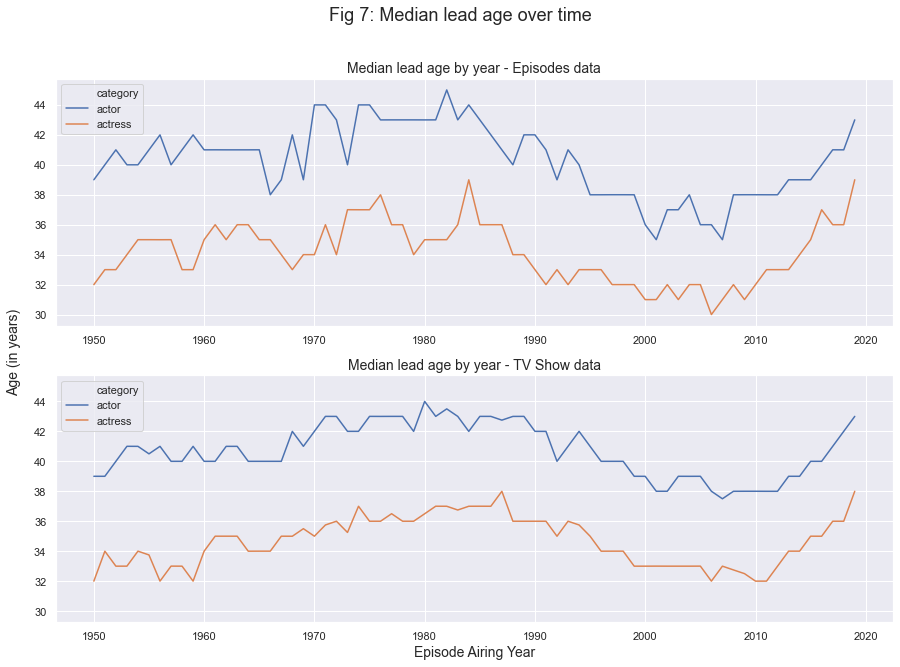

In [225]:
df = episodes_principals_mod.groupby(['episode_year', 'category'])['age'].median().reset_index()
df2 = df[(df['episode_year'] >= '1950') & (df['episode_year'] <= '2019')]

fig = plt.figure(figsize=(15,10))
plt.subplot(2,1,1)
ax = sns.lineplot(x='episode_year', y='age', hue='category', data=df2)
ax.set(xlabel='', ylabel='')
plt.title(label='Median lead age by year - Episodes data', fontsize=14)

plt.subplot(2,1,2, sharex=ax, sharey=ax)
df3 = episodes_principals_mod.groupby(['series_id','episode_year','category'])['age'].median().reset_index()
df4 = df3.groupby(['episode_year','category'])['age'].median().reset_index()
df5 = df4[(df4['episode_year'] >= '1950') & (df4['episode_year'] <= '2019')]
ax2 = sns.lineplot(x='episode_year', y='age', hue='category', data=df5)
ax2.set_xlabel('Episode Airing Year', fontsize=14)                                
ax2.set_ylabel('', fontsize=14)
plt.title(label='Median lead age by year - TV Show data', fontsize=14)

fig.text(0.08, 0.5, 'Age (in years)', va='center', rotation='vertical', fontsize=14)

plt.suptitle('Fig 7: Median lead age over time', fontsize=18)
fig.savefig('fig2.7.png', dpi=fig.dpi)

### 10) Series analysis - by gender

In [86]:
tvseries_full = tvseries[tvseries['startYear'] != '\\N']
tvseries_full.describe(include='all') 
tvseries_principals = pd.merge(tvseries_full, principals_names_mod, left_on='tconst', right_on='tconst')
tvseries_principals['startYear'] = pd.to_datetime(tvseries_principals['startYear'], format='%Y')
tvseries_principals.describe(include='all')

,tconst,titleType,primaryTitle,originalTitle,isAdult,startYear,endYear,runtimeMinutes,genres,ordering,nconst,category,job,characters,primaryName,birthYear,deathYear,primaryProfession,knownForTitles
count,58240,58240,58240,58240,58240.000,58240,58240,58240,58240,58240.000,58240,58240,58240,58240,58240,58240,58240,58034,58240
unique,58240,2,55622,55826,nan,89,80,583,915,nan,32265,2,1,39086,32179,135,73,1130,32221
top,tt0164277,tvSeries,Joulukalenteri,Joulukalenteri,nan,2015-01-01 00:00:00,\N,\N,Comedy,nan,nm3194537,actor,\N,\N,Mark Chinnery,1972,\N,actor,"tt6771298,tt2024539,tt1024165,tt3839332"
freq,1,48752,19,19,nan,2165,38181,25784,10728,nan,57,37510,58240,8235,57,1198,46690,12021,57
first,NaN,NaN,NaN,NaN,nan,1902-01-01 00:00:00,NaN,NaN,NaN,nan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
last,NaN,NaN,NaN,NaN,nan,2023-01-01 00:00:00,NaN,NaN,NaN,nan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,NaN,0.011,NaN,NaN,NaN,NaN,1.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,0.105,NaN,NaN,NaN,NaN,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,0.000,NaN,NaN,NaN,NaN,1.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,0.000,NaN,NaN,NaN,NaN,1.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


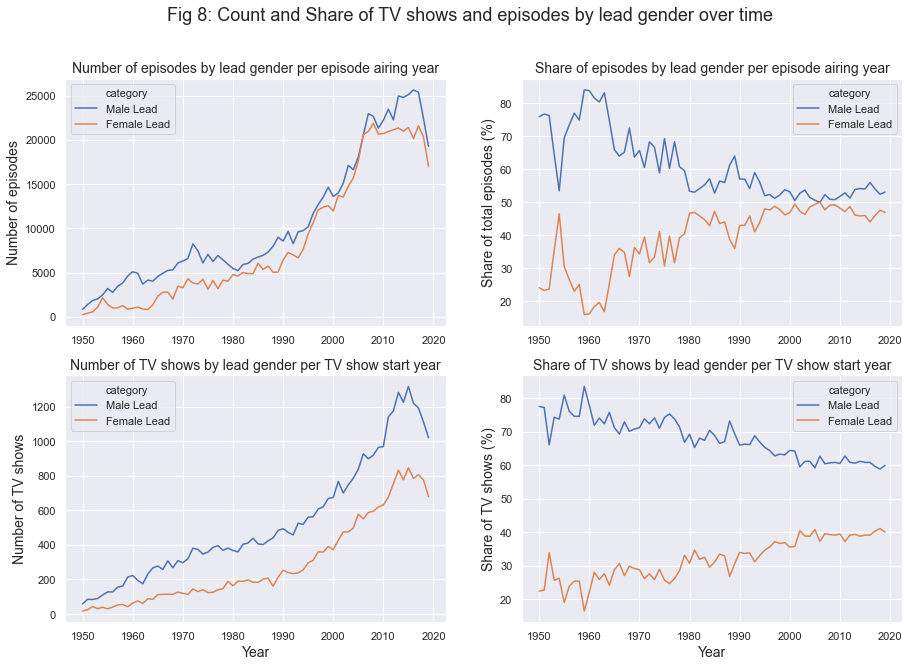

In [237]:
df = episodes_principals.groupby(['episode_year','category'])['series_id'].count().reset_index()
df2 = df[(df['episode_year'] >= '1950') & (df['episode_year'] <= '2019')]
df3 = df2.copy()
df3['category'] = df2['category'].apply(lambda x: 'Female Lead' if x == 'actress' else 'Male Lead')
df3a = df3.groupby('episode_year')['series_id'].sum().reset_index()
df3b = pd.merge(df3, df3a, on='episode_year')
df3b['Share'] = df3b['series_id_x']/df3b['series_id_y']*100

fig = plt.figure(figsize=(15,10))
plt.subplot(2,2,1)
ax = sns.lineplot(x='episode_year', y='series_id', hue='category', data=df3)
ax.set_xlabel('', fontsize=14)                                
ax.set_ylabel('Number of episodes', fontsize=14)
plt.title(label='Number of episodes by lead gender per episode airing year', fontsize=14)

plt.subplot(2,2,2)
ax2 = sns.lineplot(x='episode_year', y='Share', hue='category', data=df3b)
ax2.set_xlabel('', fontsize=14)                                
ax2.set_ylabel('Share of total episodes (%)', fontsize=14)
plt.title(label='Share of episodes by lead gender per episode airing year', fontsize=14)

tvshow_filter = episodes_principals.groupby('series_id').count()[['episode_id']].reset_index()
tvshow_filter.rename(columns={"episode_id": "episode_count"}, inplace=True)
tvseries_principals2 = pd.merge(tvseries_principals, tvshow_filter, left_on='tconst', right_on='series_id')

plt.subplot(2,2,3, sharex=ax)
df4 = tvseries_principals2.groupby(['startYear','category'])['tconst'].count().reset_index()
df5 = df4[(df4['startYear'] >= '1950') & (df4['startYear'] <= '2019')]
df6 = df5.copy()
df6['category'] = df5['category'].apply(lambda x: 'Female Lead' if x == 'actress' else 'Male Lead')
df6a = df6.groupby('startYear')['tconst'].sum().reset_index()
df6b = pd.merge(df6, df6a, on='startYear')
df6b['Share'] = df6b['tconst_x']/df6b['tconst_y']*100

ax3 = sns.lineplot(x='startYear', y='tconst', hue='category', data=df6)
ax3.set_xlabel('Year', fontsize=14)                                
ax3.set_ylabel('Number of TV shows', fontsize=14)
plt.title(label='Number of TV shows by lead gender per TV show start year', fontsize=14)

plt.subplot(2,2,4, sharex=ax)
ax4 = sns.lineplot(x='startYear', y='Share', hue='category', data=df6b)
ax4.set_xlabel('Year', fontsize=14)                                
ax4.set_ylabel('Share of TV shows (%)', fontsize=14)
plt.title(label='Share of TV shows by lead gender per TV show start year', fontsize=14)

plt.suptitle('Fig 8: Count and Share of TV shows and episodes by lead gender over time', fontsize=18)
fig.savefig('fig2.8.png', dpi=fig.dpi)

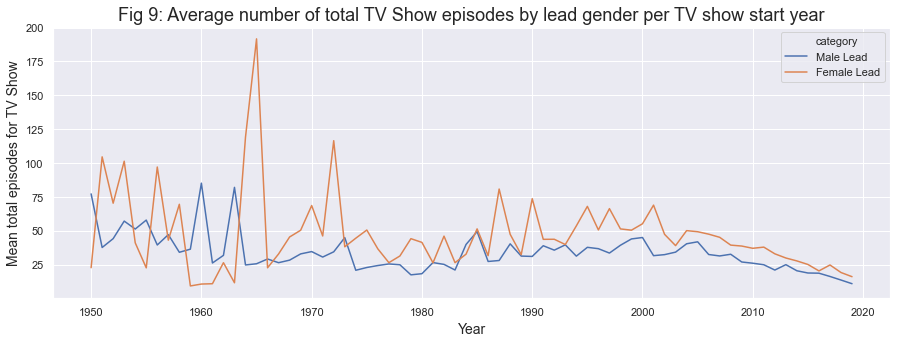

In [268]:
df4 = tvseries_principals2.groupby(['startYear','category'])['episode_count'].mean().reset_index()
df5 = df4[(df4['startYear'] >= '1950') & (df4['startYear'] <= '2019')]
df6 = df5.copy()
df6['category'] = df5['category'].apply(lambda x: 'Female Lead' if x == 'actress' else 'Male Lead')

fig = plt.figure(figsize=(15,5))
ax = sns.lineplot(x='startYear', y='episode_count', hue='category', data=df6)
ax.set_xlabel('Year', fontsize=14)                                
ax.set_ylabel('Mean total episodes for TV Show', fontsize=14)
plt.title(label='Fig 9: Average number of total TV Show episodes by lead gender per TV show start year', fontsize=18)
fig.savefig('fig2.9.png', dpi=fig.dpi)

In [265]:
tvseries_principals2.describe(include='all')

,tconst,titleType,primaryTitle,originalTitle,isAdult,startYear,endYear,runtimeMinutes,genres,ordering,nconst,category,job,characters,primaryName,birthYear,deathYear,primaryProfession,knownForTitles,series_id,episode_count
count,38110,38110,38110,38110,38110.000,38110,38110,38110,38110,38110.000,38110,38110,38110,38110,38110,38110,38110,38050,38110,38110,38110.000
unique,38110,2,36388,36538,nan,79,77,534,810,nan,22856,2,1,29654,22812,134,69,881,22840,38110,nan
top,tt0164277,tvSeries,Anna Karenina,Anna Karenina,nan,2015-01-01 00:00:00,\N,\N,Comedy,nan,nm0160049,actor,\N,\N,Luci Christian,1971,\N,actor,"tt1043842,tt0415906,tt5626028,tt0090248",tt0164277,nan
freq,1,31592,8,8,nan,1513,24341,14098,7413,nan,21,24424,38110,2869,21,818,30943,7210,21,1,nan
first,NaN,NaN,NaN,NaN,nan,1936-01-01 00:00:00,NaN,NaN,NaN,nan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,nan
last,NaN,NaN,NaN,NaN,nan,2021-01-01 00:00:00,NaN,NaN,NaN,nan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,nan
mean,NaN,NaN,NaN,NaN,0.006,NaN,NaN,NaN,NaN,1.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,32.831
std,NaN,NaN,NaN,NaN,0.080,NaN,NaN,NaN,NaN,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,142.027
min,NaN,NaN,NaN,NaN,0.000,NaN,NaN,NaN,NaN,1.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000
25%,NaN,NaN,NaN,NaN,0.000,NaN,NaN,NaN,NaN,1.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.000


In [138]:
tvseries_ratings_full = tvseries_ratings[tvseries_ratings['startYear'] != '\\N']
principals_top4 = principals[principals['ordering'] <= 4]
principals_tvseries_top4 = pd.merge(tvseries_ratings_full, principals_top4, on='tconst')
principals_tvseries_top4.describe(include='all')

tvseries_topperson4 = principals_tvseries_top4[principals_tvseries_top4['numVotes'] >= 1000]
tvseries_topperson2 = tvseries_topperson4[tvseries_topperson4['ordering'] <= 2]
tvseries_topperson = tvseries_topperson4[tvseries_topperson4['ordering'] == 1]

tvseries_topperson_a = pd.merge(tvseries_topperson, episodes, left_on='tconst', right_on='parentTconst')
tvseries_topperson_a = tvseries_topperson_a[(tvseries_topperson_a['seasonNumber'] != '\\N') & (tvseries_topperson_a['episodeNumber'] != '\\N')]
tvseries_topperson_a.rename(columns={"tconst_x": "tconst"}, inplace=True)
tvseries_topperson_a['seasonNumber'] = tvseries_topperson_a['seasonNumber'].astype(int)
tvseries_seasons = tvseries_topperson_a.groupby('tconst')[['seasonNumber']].max().reset_index()
tvseries_seasons2 = tvseries_seasons[tvseries_seasons['seasonNumber'] <= 82]
tvseries_episodes = tvseries_topperson_a.groupby('tconst')[['episodeNumber']].count().reset_index()
tvseries_topperson_b = pd.merge(tvseries_topperson, tvseries_seasons2, on='tconst')
tvseries_topperson = pd.merge(tvseries_topperson_b, tvseries_episodes, on='tconst')
tvseries_topperson.rename(columns={"episodeNumber": "numEpisodes"}, inplace=True)
tvseries_topperson.rename(columns={"seasonNumber": "numSeasons"}, inplace=True)

tmp1 = tvseries_topperson4[tvseries_topperson4['category'] == 'actor']
tmp2 = tvseries_topperson4[tvseries_topperson4['category'] == 'actress']
tmp11 = tmp1.groupby('tconst')[['ordering']].count().reset_index()
tmp22 = tmp2.groupby('tconst')[['ordering']].count().reset_index()
tvseries_topperson5 = pd.merge(tvseries_topperson4, tmp11, on='tconst', how='left')
tvseries_topperson6 = pd.merge(tvseries_topperson5, tmp22, on='tconst', how='left')
tvseries_topperson6.head(n=10)
tvseries_topperson6['top4_actor'] = tvseries_topperson6['ordering_y'].apply(lambda x: 0 if x != x else (1 if x > 2 else 0))
tvseries_topperson6['top4_actress'] = tvseries_topperson6['ordering'].apply(lambda x: 0 if x != x else (1 if x > 2 else 0))
tvseries_topperson6['top4_other'] = 1 - tvseries_topperson6[['top4_actor', 'top4_actress']].max(axis=1)
tvseries_topperson6 = tvseries_topperson6[['tconst', 'top4_actress', 'top4_other']]
tvseries_topperson6.drop_duplicates(inplace=True)
tvseries_topperson6.describe(include='all')

tmp1 = tvseries_topperson2[tvseries_topperson2['category'] == 'actor']
tmp2 = tvseries_topperson2[tvseries_topperson2['category'] == 'actress']
tmp11 = tmp1.groupby('tconst')[['ordering']].count().reset_index()
tmp22 = tmp2.groupby('tconst')[['ordering']].count().reset_index()
tvseries_topperson5a = pd.merge(tvseries_topperson2, tmp11, on='tconst', how='left')
tvseries_topperson6a = pd.merge(tvseries_topperson5a, tmp22, on='tconst', how='left')
tvseries_topperson6a.head(n=10)
tvseries_topperson6a['top2_actor'] = tvseries_topperson6a['ordering_y'].apply(lambda x: 0 if x != x else (1 if x > 1 else 0))
tvseries_topperson6a['top2_actress'] = tvseries_topperson6a['ordering'].apply(lambda x: 0 if x != x else (1 if x > 1 else 0))
tvseries_topperson6a['top2_other'] = 1 - tvseries_topperson6a[['top2_actor', 'top2_actress']].max(axis=1)
tvseries_topperson6a = tvseries_topperson6a[['tconst', 'top2_actress', 'top2_other']]
tvseries_topperson6a.drop_duplicates(inplace=True)

tvseries_topperson_a = tvseries_topperson[tvseries_topperson['startYear'] != '\\N']
tvseries_topperson_b = tvseries_topperson_a.copy()
tvseries_topperson_b['startYear'] = pd.to_datetime(tvseries_topperson_a['startYear'], format='%Y')
tvseries_topperson_b['seriesYearSince2020'] = 1 + (pd.to_datetime('01/01/2020') - tvseries_topperson_b['startYear'])/ np.timedelta64(1, 'Y')
tvseries_topperson_b['seriesYearSince2020'] = 1 + (pd.to_datetime('01/01/2020') - tvseries_topperson_b['startYear'])/ np.timedelta64(1, 'Y')

tvseries_topperson_b.describe(include='all')

one_hot2 = pd.get_dummies(tvseries_topperson_b['category'], prefix='top_ordering', drop_first=True)
tvseries_topperson_b = tvseries_topperson_b.drop('category',axis = 1)
# Join the encoded df
tvseries_topperson_b = tvseries_topperson_b.join(one_hot2)
tvseries_topperson_b.describe(include='all')

tmp = pd.concat([pd.Series(row['tconst'], row['genres'].split(','))              
                    for _, row in tvseries_topperson_b.iterrows()]).reset_index()
tmp.rename(columns={"index":"genres", 0:"tconst"}, inplace=True)
tvseries_topperson_c = pd.merge(tvseries_topperson_b, tmp, on='tconst')

one_hot = pd.get_dummies(tvseries_topperson_c['genres_y'], prefix='genre')
one_hot.describe(include='all')

one_hot.drop("genre_\\N", axis=1, inplace=True)
# Join the encoded df
tvseries_topperson_c = tvseries_topperson_c.join(one_hot)
tvseries_topperson_c.describe(include='all')

tvseries_topperson_d = tvseries_topperson_c.groupby('tconst').sum()[['genre_Action', 'genre_Adventure', 'genre_Animation',
       'genre_Biography', 'genre_Comedy', 'genre_Crime', 'genre_Documentary',
       'genre_Drama', 'genre_Family', 'genre_Fantasy', 'genre_Game-Show',
       'genre_History', 'genre_Horror', 'genre_Music', 'genre_Musical',
       'genre_Mystery', 'genre_News', 'genre_Reality-TV', 'genre_Romance',
       'genre_Sci-Fi', 'genre_Short', 'genre_Sport', 'genre_Talk-Show',
       'genre_Thriller', 'genre_War', 'genre_Western']]
tvseries_topperson_e = pd.merge(tvseries_topperson_b, tvseries_topperson_d, on='tconst')
tvseries_topperson_f = pd.merge(tvseries_topperson_e, tvseries_topperson6a, on='tconst')
tvseries_topperson_g = pd.merge(tvseries_topperson_f, tvseries_topperson6, on='tconst')

tvseries_topperson_g['women_show'] = (tvseries_topperson_g['top_ordering_actress']) & (tvseries_topperson_g['top2_actress'] | tvseries_topperson_g['top4_actress'])

tvseries_topperson_g['men_show'] = ((1-tvseries_topperson_g['top_ordering_actress']) & (1-tvseries_topperson_g['top_ordering_archive_footage']) &
                     (1-tvseries_topperson_g['top_ordering_self']) & (1-tvseries_topperson_g['top_ordering_writer'])) & (((1-tvseries_topperson_g['top2_actress']) & (1-tvseries_topperson_g['top2_other'])) | 
                     ((1-tvseries_topperson_g['top4_actress']) & (1-tvseries_topperson_g['top4_other'])))

tvseries_topperson_g['other_show'] = 1 - tvseries_topperson_g[['women_show', 'men_show']].max(axis=1)

tvseries_topperson_g['log_numVotes'] = np.log(tvseries_topperson_g['numVotes'])
tvseries_topperson_g['log_numEpisodes'] = np.log(tvseries_topperson_g['numEpisodes'])
tvseries_topperson_g['log_numSeasons'] = np.log(tvseries_topperson_g['numSeasons'])

tvseries_topperson_g.drop(columns=['isAdult', 'ordering'], inplace=True)

tvseries_topperson_g.describe(include='all')

,tconst,titleType,primaryTitle,originalTitle,startYear,endYear,runtimeMinutes,genres,averageRating,numVotes,nconst,job,characters,numSeasons,numEpisodes,seriesYearSince2020,top_ordering_actress,top_ordering_archive_footage,top_ordering_self,top_ordering_writer,genre_Action,genre_Adventure,genre_Animation,genre_Biography,genre_Comedy,genre_Crime,genre_Documentary,genre_Drama,genre_Family,genre_Fantasy,genre_Game-Show,genre_History,genre_Horror,genre_Music,genre_Musical,genre_Mystery,genre_News,genre_Reality-TV,genre_Romance,genre_Sci-Fi,genre_Short,genre_Sport,genre_Talk-Show,genre_Thriller,genre_War,genre_Western,top2_actress,top2_other,top4_actress,top4_other,women_show,men_show,other_show,log_numVotes,log_numEpisodes,log_numSeasons
count,6005,6005,6005,6005,6005,6005,6005,6005,6005.000,6005.000,6005,6005,6005,6005.000,6005.000,6005.000,6005.000,6005.000,6005.000,6005.000,6005.000,6005.000,6005.000,6005.000,6005.000,6005.000,6005.000,6005.000,6005.000,6005.000,6005.000,6005.000,6005.000,6005.000,6005.000,6005.000,6005.000,6005.000,6005.000,6005.000,6005.000,6005.000,6005.000,6005.000,6005.000,6005.000,6005.000,6005.000,6005.000,6005.000,6005.000,6005.000,6005.000,6005.000,6005.000,6005.000
unique,6005,2,5800,5818,72,68,345,483,nan,nan,4606,2,5246,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
top,tt3426990,tvSeries,The Twilight Zone,Spider-Man,2016-01-01 00:00:00,\N,60,Comedy,nan,nan,nm0041003,\N,"[""Self""]",nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
freq,1,5133,4,4,345,2101,1157,727,nan,nan,24,6004,206,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
first,NaN,NaN,NaN,NaN,1948-01-01 00:00:00,NaN,NaN,NaN,nan,nan,NaN,NaN,NaN,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
last,NaN,NaN,NaN,NaN,2020-01-01 00:00:00,NaN,NaN,NaN,nan,nan,NaN,NaN,NaN,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.340,13641.652,NaN,NaN,NaN,3.692,95.227,15.515,0.289,0.000,0.118,0.000,0.189,0.159,0.177,0.023,0.404,0.169,0.052,0.461,0.088,0.065,0.018,0.041,0.034,0.019,0.005,0.095,0.006,0.050,0.085,0.050,0.004,0.012,0.019,0.050,0.014,0.007,0.105,0.570,0.130,0.447,0.134,0.417,0.449,8.334,3.320,0.839
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.067,50559.016,NaN,NaN,NaN,5.239,439.752,13.438,0.454,0.013,0.323,0.013,0.391,0.366,0.381,0.149,0.491,0.375,0.223,0.499,0.284,0.246,0.132,0.198,0.182,0.136,0.071,0.293,0.077,0.219,0.279,0.219,0.063,0.110,0.137,0.218,0.116,0.086,0.307,0.495,0.337,0.497,0.340,0.493,0.497,1.233,1.356,0.873
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000,1000.000,NaN,NaN,NaN,1.000,1.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,6.908,0.000,0.000
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.900,1599.000,NaN,NaN,NaN,1.000,11.000,5.999,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,7.377,2.398,0.000


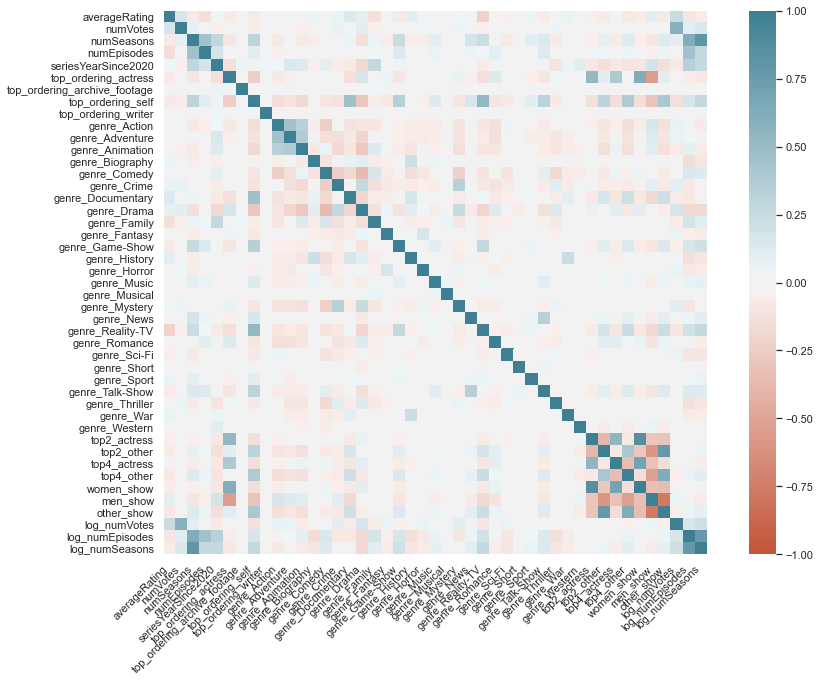

In [139]:
corr = tvseries_topperson_g[tvseries_topperson_g['numVotes'] >= 0].corr()

plt.figure(figsize=(15,10))

ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);

In [140]:
df = tvseries_topperson_g[['log_numVotes', 'log_numEpisodes', 'log_numSeasons', 'averageRating', 'seriesYearSince2020',
                                           'women_show', 'other_show']]
tmp = tvseries_topperson_g[[x for x in one_hot.columns]]
df = df.join(tmp)

df = df[tvseries_topperson_g['numVotes'] >= 1000]

y = df['averageRating']
X = df.drop('averageRating', axis=1)

X2 = sm.add_constant(X)
est = sm.OLS(y, X2)
est2 = est.fit()
print(est2.summary())

                            OLS Regression Results                            
Dep. Variable:          averageRating   R-squared:                       0.201
Model:                            OLS   Adj. R-squared:                  0.197
Method:                 Least Squares   F-statistic:                     46.94
Date:                Wed, 24 Jun 2020   Prob (F-statistic):          4.54e-262
Time:                        14:36:03   Log-Likelihood:                -8235.6
No. Observations:                6005   AIC:                         1.654e+04
Df Residuals:                    5972   BIC:                         1.676e+04
Df Model:                          32                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                   5.5605    

In [272]:
# Regression with min 5000 votes
df = tvseries_topperson_g[['log_numVotes', 'log_numEpisodes', 'log_numSeasons', 'averageRating', 'seriesYearSince2020',
                                           'women_show', 'other_show']]
tmp = tvseries_topperson_g[[x for x in one_hot.columns]]
df = df.join(tmp)

df = df[tvseries_topperson_g['numVotes'] >= 5000]

y = df['averageRating']
X = df.drop('averageRating', axis=1)

X2 = sm.add_constant(X)
est = sm.OLS(y, X2)
est2 = est.fit()
print(est2.summary())

                            OLS Regression Results                            
Dep. Variable:          averageRating   R-squared:                       0.293
Model:                            OLS   Adj. R-squared:                  0.282
Method:                 Least Squares   F-statistic:                     26.51
Date:                Thu, 25 Jun 2020   Prob (F-statistic):          9.79e-130
Time:                        19:32:28   Log-Likelihood:                -2309.3
No. Observations:                2078   AIC:                             4685.
Df Residuals:                    2045   BIC:                             4871.
Df Model:                          32                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                   5.3831    

In [153]:
# Regression with min 20000 votes
df = tvseries_topperson_g[['log_numVotes', 'log_numEpisodes', 'log_numSeasons', 'averageRating', 'seriesYearSince2020',
                                           'women_show', 'other_show']]
tmp = tvseries_topperson_g[[x for x in one_hot.columns]]
df = df.join(tmp)

df = df[tvseries_topperson_g['numVotes'] >= 20000]

y = df['averageRating']
X = df.drop('averageRating', axis=1)

X2 = sm.add_constant(X)
est = sm.OLS(y, X2)
est2 = est.fit()
print(est2.summary())

                            OLS Regression Results                            
Dep. Variable:          averageRating   R-squared:                       0.388
Model:                            OLS   Adj. R-squared:                  0.359
Method:                 Least Squares   F-statistic:                     13.57
Date:                Wed, 24 Jun 2020   Prob (F-statistic):           7.24e-54
Time:                        14:39:58   Log-Likelihood:                -666.97
No. Observations:                 719   AIC:                             1400.
Df Residuals:                     686   BIC:                             1551.
Df Model:                          32                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                   4.7267    

In [284]:
tvseries_episodes_ratings_stats.describe(include='all')

data_5kvotes = tvseries_topperson_g[tvseries_topperson_g['numVotes'] >= 5000][['tconst','women_show','men_show','other_show']]

tmp1 = pd.merge(data_5kvotes, tvseries_episodes_ratings_popular, left_on='tconst', right_on='id')
tmp1['showGroupInt'] = tmp1['women_show'].apply(str)+tmp1['men_show'].apply(str)+tmp1['other_show'].apply(str)
tmp1['showGroup'] = tmp1['showGroupInt'].apply(lambda x: 'More female leads' if x == '100' else ('More male leads' if x == '010' else 'Equal leads'))
tmp1.loc[tmp1.endYear == '\\N', 'endYear'] = ''
tmp1['showTitle'] = tmp1["primaryTitle"] + " (" + tmp1["startYear"].astype(str) + "-" + tmp1["endYear"].astype(str) + ")"


tmp1.describe(include='all')

,tconst,women_show,men_show,other_show,id,primaryTitle,startYear,endYear,genres,titleType,averageRating,numVotes,wtd_mean_averageRating,mean_averageRating,mean_numVotes,stdDev_averageRating,stdDev_numVotes,median_averageRating,median_numVotes,min_averageRating,min_numVotes,max_averageRating,max_numVotes,numSeasons,q1_averageRating,q3_averageRating,total_numVotes,total_episodes,q1a_averageRating,q3a_averageRating,rel_avgRatingDeviation_pc,rel_stdDevRating_pc,log_numVotes,log_mean_numVotes,log_median_numVotes,log_total_episodes,ratingGroup,median_ratingGroup,mean_ratingGroup,rel_medDevRating_pc,seasonGroup,yearGroup,showTitle,series_episodes_rating,median_mean_rating,showGroupInt,showGroup
count,799,799.000,799.000,799.000,799,799,799,799,799,799,799.000,799.000,799.000,799.000,799.000,799.000,799.000,799.000,799.000,799.000,799.000,799.000,799.000,799.000,799.000,799.000,799.000,799.000,799.000,799.000,799.000,799.000,799.000,799.000,799.000,799.000,799,799,799,799.000,799,799,799,799,799,799,799
unique,799,nan,nan,nan,799,788,49,49,156,2,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,3,3,3,nan,3,3,799,649,734,3,3
top,tt0112159,nan,nan,nan,tt0112159,Battlestar Galactica,2019,,"Crime,Drama,Mystery",tvSeries,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,Below 8.0,8.0-8.5,8.0-8.5,nan,2-4,2015-2020,Utopia (2013-2014),"1, 8, 8.1","8.4, 8.4",010,More male leads
freq,1,nan,nan,nan,1,3,90,270,73,689,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,353,332,326,nan,305,403,1,5,5,372,372
mean,NaN,0.118,0.466,0.417,NaN,NaN,NaN,NaN,NaN,NaN,7.932,71458.433,8.115,8.089,1311.895,0.398,434.148,8.078,1221.522,7.215,828.517,8.892,2877.429,3.413,7.847,8.327,62605.434,48.783,7.691,8.504,-2.308,4.961,10.495,6.609,6.549,3.226,NaN,NaN,NaN,10.113,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,0.322,0.499,0.493,NaN,NaN,NaN,NaN,NaN,NaN,0.740,122785.927,0.560,0.553,3180.968,0.190,1773.404,0.548,2829.919,0.962,2191.383,0.670,9674.047,3.358,0.574,0.561,173521.076,69.579,0.616,0.588,7.022,2.503,1.103,0.864,0.863,1.134,NaN,NaN,NaN,5.382,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,0.000,0.000,0.000,NaN,NaN,NaN,NaN,NaN,NaN,3.500,5009.000,3.712,3.700,230.862,0.000,5.657,3.700,250.000,2.500,5.000,4.000,279.000,1.000,3.600,3.800,600.000,2.000,3.500,3.900,-71.429,0.000,8.519,5.442,5.521,0.693,NaN,NaN,NaN,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,NaN,0.000,0.000,0.000,NaN,NaN,NaN,NaN,NaN,NaN,7.500,15020.000,7.856,7.813,376.880,0.277,94.078,7.800,351.500,6.900,241.500,8.500,680.000,1.000,7.575,8.050,5687.000,10.000,7.400,8.200,-5.783,3.408,9.617,5.932,5.862,2.303,NaN,NaN,NaN,6.641,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,0.000,0.000,0.000,NaN,NaN,NaN,NaN,NaN,NaN,8.100,33149.000,8.162,8.133,587.986,0.370,174.363,8.100,549.500,7.500,376.000,9.000,1139.000,2.000,7.900,8.400,16985.000,24.000,7.775,8.588,-1.370,4.514,10.409,6.377,6.309,3.178,NaN,NaN,NaN,9.320,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,0.000,1.000,1.000,NaN,NaN,NaN,NaN,NaN,NaN,8.400,76220.500,8.477,8.440,1200.757,0.478,358.413,8.400,1136.250,7.800,722.500,9.400,2581.500,5.000,8.200,8.700,53132.000,59.000,8.100,8.900,1.724,5.865,11.241,7.091,7.035,4.078,NaN,NaN,NaN,12.351,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [186]:
df = tmp1
df['size'] = 4

from bokeh.plotting import figure, output_file, output_notebook, show, ColumnDataSource
from bokeh.models import HoverTool, CategoricalColorMapper, Legend, LegendItem
from bokeh.transform import factor_mark, factor_cmap 
from bokeh.palettes import Magma

output_notebook()

source = ColumnDataSource(data=df)

p = figure(plot_width=900, plot_height=600, tools=["zoom_in","zoom_out","pan","wheel_zoom"], 
           title="TV Show rating v/s Number of votes (Interactive plot)")
#p.min_border_top = 300
#p.min_border_bottom = 100

COLOR_FACTORS = ['More male leads','Equal leads','More female leads']

scatter = p.scatter('log_numVotes', 'averageRating', size='size', source=source, alpha=0.5,
                  color=factor_cmap("showGroup", Magma[3], COLOR_FACTORS))

x = np.array(df['log_numVotes'])
y = np.array(df['averageRating'])

# fit line from linear regression above
par = np.polyfit(x, y, 1, full=True)
slope = par[0][0]
intercept = par[0][1]
y_predicted = [slope*i + intercept  for i in x]

line = p.line(x, y_predicted, color='green')

hover = HoverTool(tooltips=[
    ("Title", "@showTitle"),
    ("Seasons, Episodes, Rating", "@series_episodes_rating"),
    ("Total votes", "@numVotes"),
    ("Genres", "@genres"),
    ("Show Type", "@showGroup")
], renderers=[scatter])

p.add_tools(hover)

# create an invisible renderer to drive color legend
rc = p.rect(x=9, y=4, height=1, width=1, color=Magma[3])
rc.visible = False

# add a color legend with explicit index, set labels to fit your need
legend = Legend(items=[
    LegendItem(label=COLOR_FACTORS[i], renderers=[rc], index=i) for i, c in enumerate(Magma[3])
], location="bottom_right")
legend.title = 'Top 4 lead actors gender group'
p.add_layout(legend)

p.title.align = 'center'
p.xaxis.axis_label = 'Total votes (Log scale)'
p.yaxis.axis_label = 'TV Show Rating'
p.background_fill_color = "grey"
p.xaxis.axis_label_text_font_size = "12pt"
p.yaxis.axis_label_text_font_size = "12pt"
p.title.text_font_size = '12pt'

show(p)

Loading BokehJS ...

In [285]:
df = tmp1
df['averageRating'] = df['averageRating'].round(3)
df['numSeasons'] = df['numSeasons'].round(1)
df['total_episodes'] = df['total_episodes'].round(1)

fig = px.box(df, x="showGroup", y="averageRating", points='all',hover_name='showTitle',
             hover_data=['numSeasons','total_episodes','averageRating','genres'],
             labels={'showTitle':'Title', 'numSeasons': 'Total Seasons', 'total_episodes': 'Total Episodes', 
                     'averageRating': 'TV Show Rating', 'genres': 'Genres', 'showGroup': 'Lead actors gender group'},
             title="Fig 10: TV Show Rating by top 4 lead actors gender grouping (Interactive plot)",
width=900, height=600)
fig.show()
fig.write_html("fig2.10.html")